In [103]:
import numpy as np
import os
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
#!pip install librosa
#!pip install tensorflow
import librosa
import librosa.display
import soundfile as sf
import random
import configparser
import math
#import tensorflow as tf 
#import utility_functions as uf
import IPython.display as ipd
from IPython.display import Audio

#!pip install audiomentations
from audiomentations import Compose, AddGaussianNoise, TimeStretch, PitchShift, Shift
from sklearn.preprocessing import LabelEncoder

# SPEECH EMOTION RECOGNITION 
RAVDESS DATASET
Filename identifiers 
-
- **Modality**
  - 01: Full-AV
  - 02: Video-only
  - 03: Audio-only

- **Vocal Channel**
  - 01: Speech
  - 02: Song

- **Emotion**
  - 01: Neutral
  - 02: Calm
  - 03: Happy
  - 04: Sad
  - 05: Angry
  - 06: Fearful
  - 07: Disgust
  - 08: Surprise

- **Emotional Intensity**
  - 01: Normal
  - 02: Strong
  - **Note**: There is no strong intensity for the 'neutral' emotion.

- **Statement**
  - 01: "Kids are talking by the door"
  - 02: "Dogs are sitting by the door"

- **Repetition**
  - 01: 1st repetition
  - 02: 2nd repetition

- **Actor**
  - 01 to 24: Odd-numbered actors are male, even-numbered actors are female
s are f

How it Works :¶

Speech Input: Similar to standard speech recognition, the user's voice is recorded.
Pre-processing: The audio is prepared by removing noise and potentially isolating specific speech segments.
Feature Extraction: Crucial features related to emotions are extracted. These include:
Prosodic features: Pitch, intonation, volume, speaking rate, pauses
Spectral Features: Spectrum of the voice, MFCCs (emphasizing qualities similar to human perception)
Voice Quality Features: Jitter, shimmer (small variations in voice quality)
Emotion Model: A trained machine learning model (often using classification algorithms) takes these features and identifies the associated emotion.
Emotion Output: The system outputs the detected emotion, typically with probability or confidence scores (e.g., angry, happy, sad, neutral, etc.).emale).

In [104]:
def decode_filename(filename):
    # Remove the file extension and split the filename
    parts = filename.replace('.wav', '').split('-')
    
    # Define mappings for each part
    map = {
        "modality": {
            '01': 'full-AV', 
            '02': 'video-only', 
            '03': 'audio-only'},
        "vocal_channel": {
            '01': 'speech', 
            '02': 'song'},
        "emotion": {
            '01': 'neutral', '02': 'calm', '03': 'happy', '04': 'sad',
            '05': 'angry', '06': 'fearful', '07': 'disgust', '08': 'surprised'},
        "emotional_intensity": {
            '01': 'normal', 
            '02': 'strong'},
        "statement": {
            '01': 'Kids are talking by the door', 
            '02': 'Dogs are sitting by the door'
        },
        "repetition": {
            '01': '1st repetition',
            '02': '2nd repetition'}
    }
    
    # Convert actor ID to determine gender
    actor_id = int(parts[6])
    gender = 'Female' if actor_id % 2 == 0 else 'Male'
    
    # Map the parts to their descriptions
    description = {
        "Modality": map["modality"].get(parts[0], 'unknown'),
        "Vocal Channel": map["vocal_channel"].get(parts[1], 'unknown'),
        "Emotion": map["emotion"].get(parts[2], 'unknown'),
        "Emotional Intensity": map["emotional_intensity"].get(parts[3], 'unknown'),
        "Statement": map["statement"].get(parts[4], 'unknown'),
        "Repetition": map["repetition"].get(parts[5], 'unknown'),
        "Actor ID": actor_id,
        "Gender": gender
    }
    
    return description


In [105]:
# Initialize an empty list to store the audio data
data = []

# Path to the main folder containing the 24 subfolders
main_folder = 'Audio_Speech_Actors_01-24'

# Loop through each subfolder(all 24 folders for each actors reading all files ) 
for subfolder in os.listdir(main_folder):
    subfolder_path = os.path.join(main_folder, subfolder)
    if os.path.isdir(subfolder_path):
        # Loop through each file in the subfolder
        for filename in os.listdir(subfolder_path):
            if filename.endswith('.wav'):
                # Store the file path and filename
                file_info = {
                    "FilePath": os.path.join(subfolder_path, filename),
                    "Filename": filename
                }
                data.append(file_info)

# Create a DataFrame from the data list
df = pd.DataFrame(data)

# Decode the filenames and add the information to the DataFrame
decoded_info = df['Filename'].apply(decode_filename)
decoded_df = pd.DataFrame(decoded_info.tolist())

# Concatenate the original DataFrame with the decoded information
data = pd.concat([df, decoded_df], axis=1)



In [106]:
data.head()

,FilePath,Filename,Modality,Vocal Channel,Emotion,Emotional Intensity,Statement,Repetition,Actor ID,Gender
0,Audio_Speech_Actors_01-24\Actor_01\03-01-01-01...,03-01-01-01-01-01-01.wav,audio-only,speech,neutral,normal,Kids are talking by the door,1st repetition,1,Male
1,Audio_Speech_Actors_01-24\Actor_01\03-01-01-01...,03-01-01-01-01-02-01.wav,audio-only,speech,neutral,normal,Kids are talking by the door,2nd repetition,1,Male
2,Audio_Speech_Actors_01-24\Actor_01\03-01-01-01...,03-01-01-01-02-01-01.wav,audio-only,speech,neutral,normal,Dogs are sitting by the door,1st repetition,1,Male
3,Audio_Speech_Actors_01-24\Actor_01\03-01-01-01...,03-01-01-01-02-02-01.wav,audio-only,speech,neutral,normal,Dogs are sitting by the door,2nd repetition,1,Male
4,Audio_Speech_Actors_01-24\Actor_01\03-01-02-01...,03-01-02-01-01-01-01.wav,audio-only,speech,calm,normal,Kids are talking by the door,1st repetition,1,Male


In [107]:
data.to_csv('initial_data.csv')


In [108]:
data = pd.read_csv('initial_data.csv')

# DATA UNDERSTANDING


In [109]:
print("Shape of the  DataFrame:")
print(data.shape)


Shape of the  DataFrame:
(1440, 11)


In [110]:
print("Unique     :",data['Gender'].value_counts())

Unique     : Gender
Male      720
Female    720
Name: count, dtype: int64


In [111]:
print("Unique Emotional Intensity:", data['Emotional Intensity'].unique())
print(data['Emotional Intensity'].value_counts())

Unique Emotional Intensity: ['normal' 'strong']
Emotional Intensity
normal    768
strong    672
Name: count, dtype: int64


In [112]:
print("Unique Emotion:", data['Emotion'].unique())

Unique Emotion: ['neutral' 'calm' 'happy' 'sad' 'angry' 'fearful' 'disgust' 'surprised']


In [113]:
data['Emotion'].value_counts()

Emotion
calm         192
happy        192
sad          192
angry        192
fearful      192
disgust      192
surprised    192
neutral       96
Name: count, dtype: int64

 * the dataset is not pefectly balanced as other data emotion states have 192 observations and neurtal have 96 observetions
* The neutral emotion has only 96 files, half the number of files compared to the other emotions.
* This might be due to the dataset design, where the neutral emotion is represented with fewer instances. According to the dataset description, the neutral emotion does not have a "strong" intensity, which could contribute to the lower count.

* NOTE: There is no strong intensity for the 'neutral' emotion.

In [114]:
print("Unique Statement:", data['Statement'] . unique())

Unique Statement: ['Kids are talking by the door' 'Dogs are sitting by the door']


In [115]:
data['Statement'].value_counts()

Statement
Kids are talking by the door    720
Dogs are sitting by the door    720
Name: count, dtype: int64

In [116]:
# Get a concise summary of the DataFrame
print("DataFrame summary:")
print(data.info())


DataFrame summary:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1440 entries, 0 to 1439
Data columns (total 11 columns):
 #   Column               Non-Null Count  Dtype 
---  ------               --------------  ----- 
 0   Unnamed: 0           1440 non-null   int64 
 1   FilePath             1440 non-null   object
 2   Filename             1440 non-null   object
 3   Modality             1440 non-null   object
 4   Vocal Channel        1440 non-null   object
 5   Emotion              1440 non-null   object
 6   Emotional Intensity  1440 non-null   object
 7   Statement            1440 non-null   object
 8   Repetition           1440 non-null   object
 9   Actor ID             1440 non-null   int64 
 10  Gender               1440 non-null   object
dtypes: int64(2), object(9)
memory usage: 123.9+ KB
None


In [117]:
# Check for missing values in the DataFrame
missing_values = data.isnull().sum()

# Print the number of missing values for each column
print("Missing values per column:")
print(missing_values)


Missing values per column:
Unnamed: 0             0
FilePath               0
Filename               0
Modality               0
Vocal Channel          0
Emotion                0
Emotional Intensity    0
Statement              0
Repetition             0
Actor ID               0
Gender                 0
dtype: int64


In [118]:
# Check for duplicate rows in the DataFrame
duplicate_rows = data.duplicated().sum()

# Print the number of duplicate rows
print("Number of duplicate rows:", duplicate_rows)


Number of duplicate rows: 0


# dataFrame  visualization

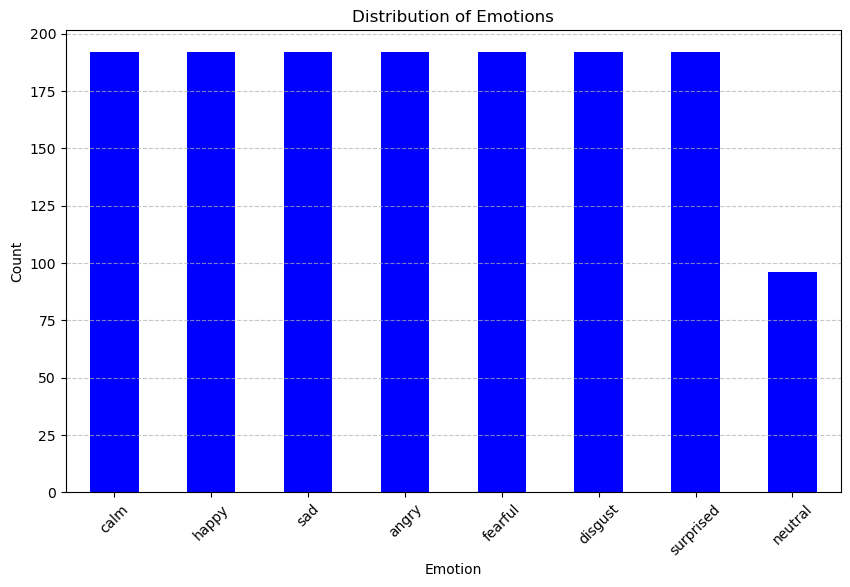

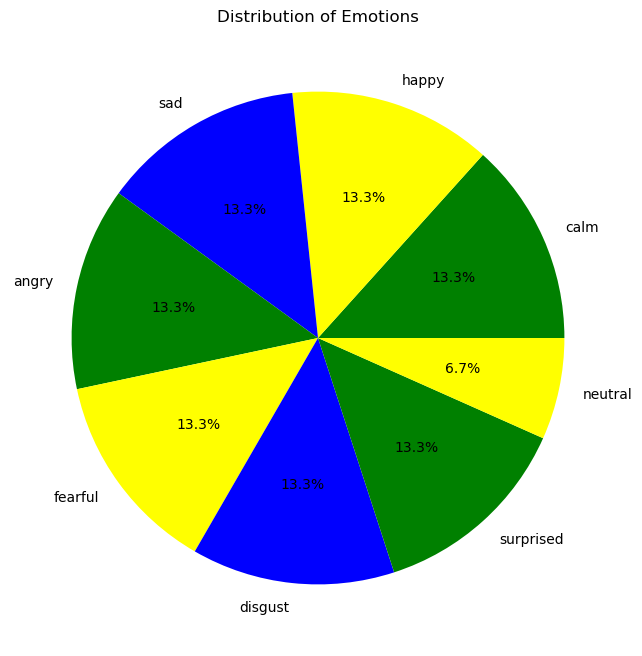

In [119]:
# Plot a bar chart for the distribution of emotions
plt.figure(figsize=(10, 6))
data['Emotion'].value_counts().plot(kind='bar', color='blue')
plt.title('Distribution of Emotions')
plt.xlabel('Emotion')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()



# Plot a pie chart for the distribution of modality
plt.figure(figsize=(8, 8))
data['Emotion'].value_counts().plot(kind='pie', autopct='%1.1f%%', colors=['green', 'yellow', 'blue'])
plt.title('Distribution of Emotions')
plt.ylabel('')
plt.show()


# FEATURE SELECTION 
# Creating the dataframe for audio and emotion 

In [120]:
## Create a dataframe
df = pd.DataFrame()
df['Speech'] = data['FilePath']
df['Emotion'] = data['Emotion']
df.head()

,Speech,Emotion
0,Audio_Speech_Actors_01-24\Actor_01\03-01-01-01...,neutral
1,Audio_Speech_Actors_01-24\Actor_01\03-01-01-01...,neutral
2,Audio_Speech_Actors_01-24\Actor_01\03-01-01-01...,neutral
3,Audio_Speech_Actors_01-24\Actor_01\03-01-01-01...,neutral
4,Audio_Speech_Actors_01-24\Actor_01\03-01-02-01...,calm


In [121]:
import random
from IPython.display import Audio, display


# Ensure 'Path' column contains the correct file paths
df['Speech'] = df['Speech'].apply(lambda x: os.path.abspath(x))

# Function to play a random audio file for each emotion
def play_random_audio_per_emotion(df):
    emotions = df['Emotion'].unique()
    for emotion in emotions:
        emotion_df = df[df['Emotion'] == emotion]
        random_file = emotion_df.sample(n=1)['Speech'].values[0]
        print(f"PLAYING A RANDOM:  {emotion}      AUDION FILE: {random_file} /n")
        display(Audio(filename=random_file, autoplay=True))

# Play a random audio file for each emotion
play_random_audio_per_emotion(df)

PLAYING A RANDOM:  neutral      AUDION FILE: c:\Users\admin\OneDrive - Sol Plaatje University\CAPSTONE PROJECT\Audio_Speech_Actors_01-24\Actor_11\03-01-01-01-01-02-11.wav /n


PLAYING A RANDOM:  calm      AUDION FILE: c:\Users\admin\OneDrive - Sol Plaatje University\CAPSTONE PROJECT\Audio_Speech_Actors_01-24\Actor_01\03-01-02-01-01-01-01.wav /n


PLAYING A RANDOM:  happy      AUDION FILE: c:\Users\admin\OneDrive - Sol Plaatje University\CAPSTONE PROJECT\Audio_Speech_Actors_01-24\Actor_13\03-01-03-02-02-02-13.wav /n


PLAYING A RANDOM:  sad      AUDION FILE: c:\Users\admin\OneDrive - Sol Plaatje University\CAPSTONE PROJECT\Audio_Speech_Actors_01-24\Actor_07\03-01-04-02-01-02-07.wav /n


PLAYING A RANDOM:  angry      AUDION FILE: c:\Users\admin\OneDrive - Sol Plaatje University\CAPSTONE PROJECT\Audio_Speech_Actors_01-24\Actor_10\03-01-05-01-01-02-10.wav /n


PLAYING A RANDOM:  fearful      AUDION FILE: c:\Users\admin\OneDrive - Sol Plaatje University\CAPSTONE PROJECT\Audio_Speech_Actors_01-24\Actor_02\03-01-06-01-02-01-02.wav /n


PLAYING A RANDOM:  disgust      AUDION FILE: c:\Users\admin\OneDrive - Sol Plaatje University\CAPSTONE PROJECT\Audio_Speech_Actors_01-24\Actor_21\03-01-07-02-01-01-21.wav /n


PLAYING A RANDOM:  surprised      AUDION FILE: c:\Users\admin\OneDrive - Sol Plaatje University\CAPSTONE PROJECT\Audio_Speech_Actors_01-24\Actor_18\03-01-08-01-01-01-18.wav /n


# AUDIO ANALYSIS 

# MFCC , WAVEFORM AND SPECTRUM VISUALIZATION FOR SPEECH AUDIOS

MFCCs:

Look for patterns that repeat over time to identify similar phonetic sounds or musical timbres.
Observe changes in the coefficients to understand how the spectral shape evolves.
Spectrogram:

Identify sustained notes (horizontal lines) and transient events (vertical lines).
Observe the distribution of energy across frequencies and how it changes over time.
Chroma Features:

Identify key and chord progressions in musical pieces.
Observe pitch class energy distribution to understand harmonic content.

In [122]:
def waveplot(data, sr, emotion):
    plt.figure(figsize=(10,4))
    plt.title(emotion, size=20)
    librosa.display.waveshow(data, sr=sr)
    plt.show()
    
def mfcc_plot(data, sr, emotion):
    mfccs = librosa.feature.mfcc(y=data, sr=sr, n_mfcc=13)
    plt.figure(figsize=(10, 4))
    plt.title(emotion, size=20)
    librosa.display.specshow(mfccs, sr=sr, x_axis='time')
    plt.colorbar()
    plt.show()

def chroma_plot(data, sr, emotion):
    chroma = librosa.feature.chroma_stft(y=data, sr=sr)
    plt.figure(figsize=(10, 4))
    plt.title(emotion, size=20)
    librosa.display.specshow(chroma, sr=sr, x_axis='time', y_axis='chroma')
    plt.colorbar()
    plt.show()

def spectrogram(data, sr, e):
    # stft function converts the data into short term fourier transform
    X = librosa.stft(data)
    Xdb = librosa.amplitude_to_db(abs(X))
    plt.figure(figsize=(12, 3))
    plt.title(emotion, size=15)
        # Display the spectrogram with a blue colormap
    #librosa.display.specshow(Xdb, sr=sr, x_axis='time', y_axis='hz', cmap='Blues')  
    librosa.display.specshow(Xdb, sr=sr, x_axis='time', y_axis='log',cmap='Blues')
    plt.colorbar()

# choose type of emotion of your choice

01: Neutral
02: Calm
03: Happy
04: Sad
05: Angry
06: Fearful
07: Disgust
08: Surprise

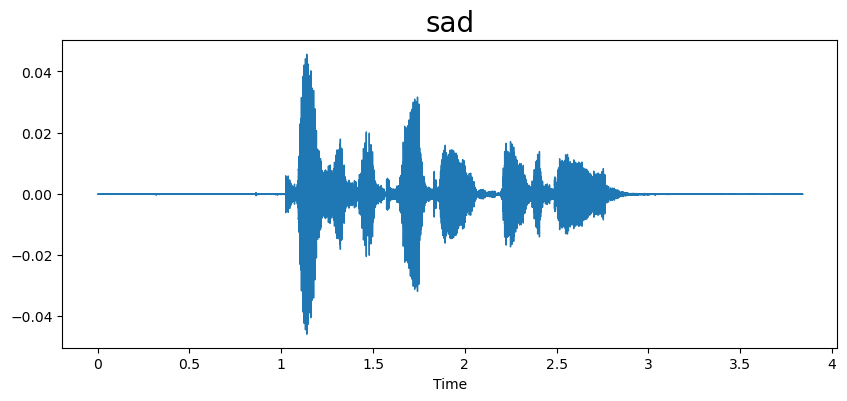

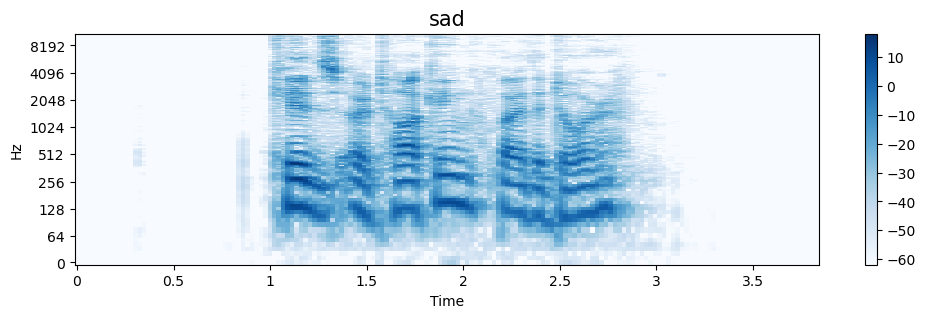

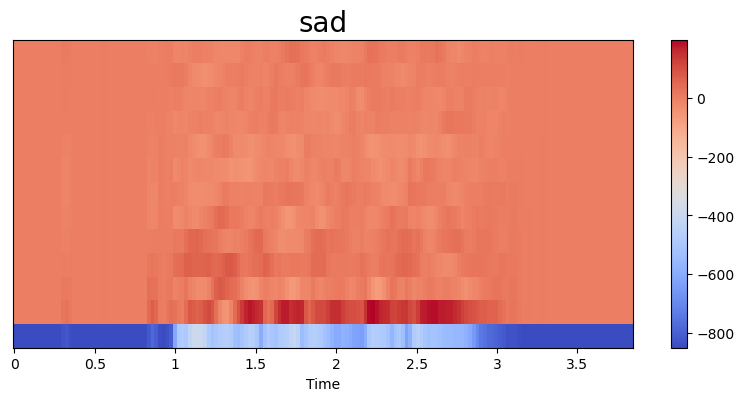

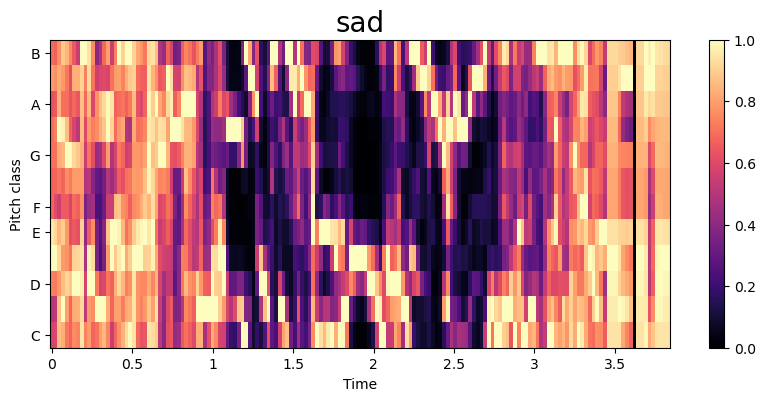

In [123]:
emotion = 'sad'
path = np.array(df['Speech'][df['Emotion']==emotion])[0]
data, sampling_rate = librosa.load(path)
waveplot(data, sampling_rate, emotion)
spectrogram(data, sampling_rate, emotion)
mfcc_plot(data,sampling_rate, emotion)
chroma_plot(data, sampling_rate, emotion)
Audio(path)

Visualizing features for neutral emotion...


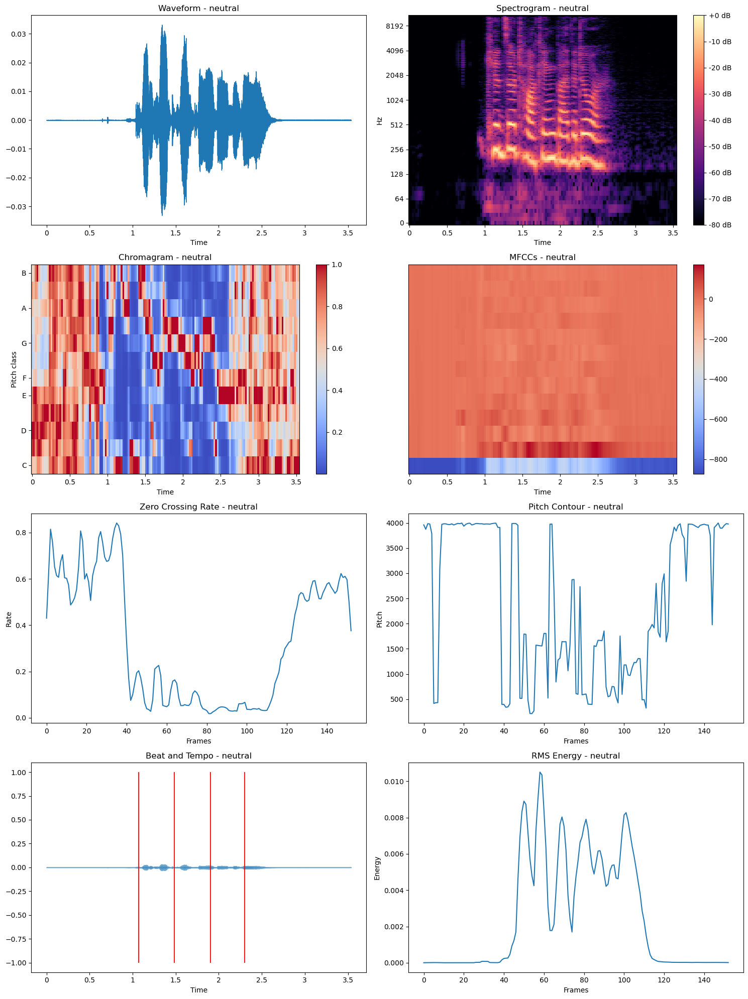

Visualizing features for calm emotion...


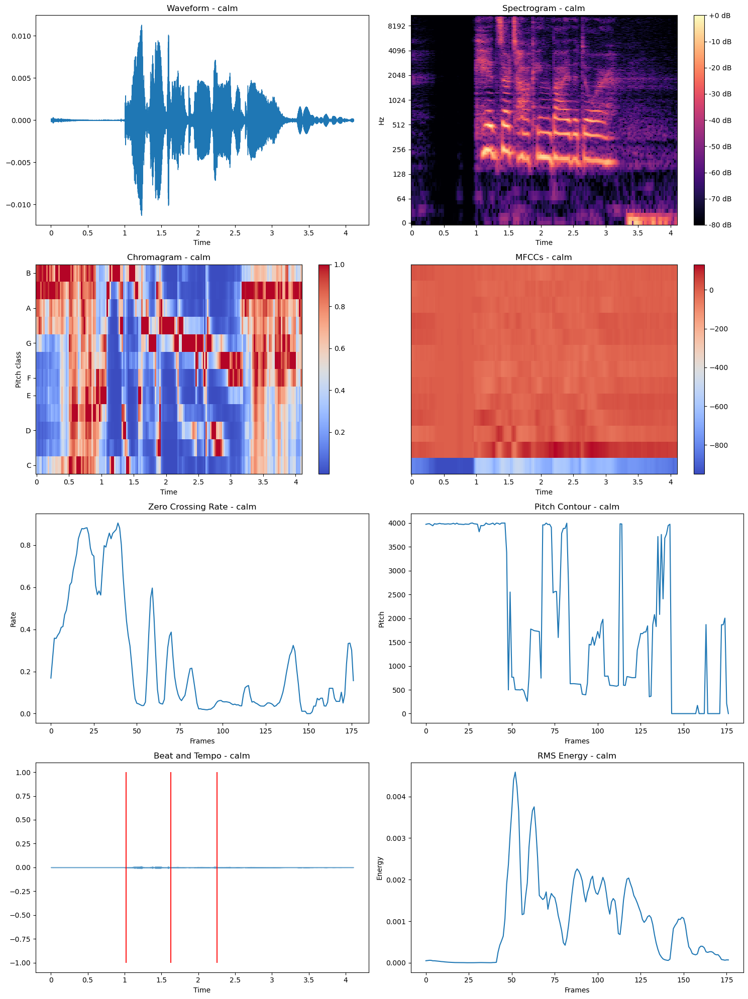

Visualizing features for happy emotion...


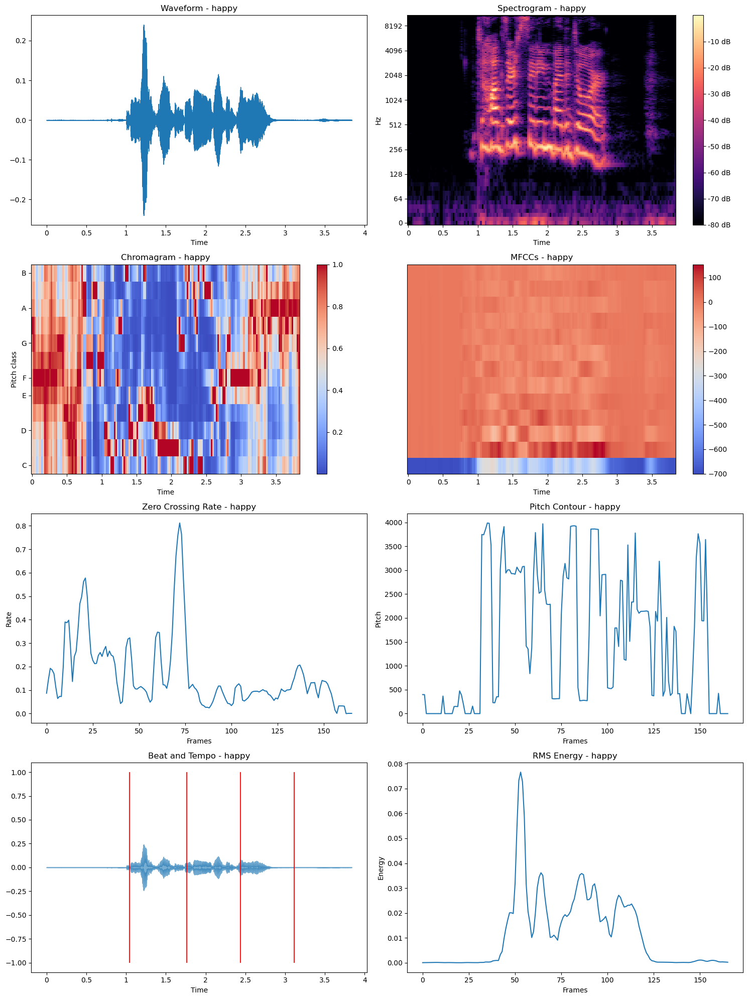

Visualizing features for sad emotion...


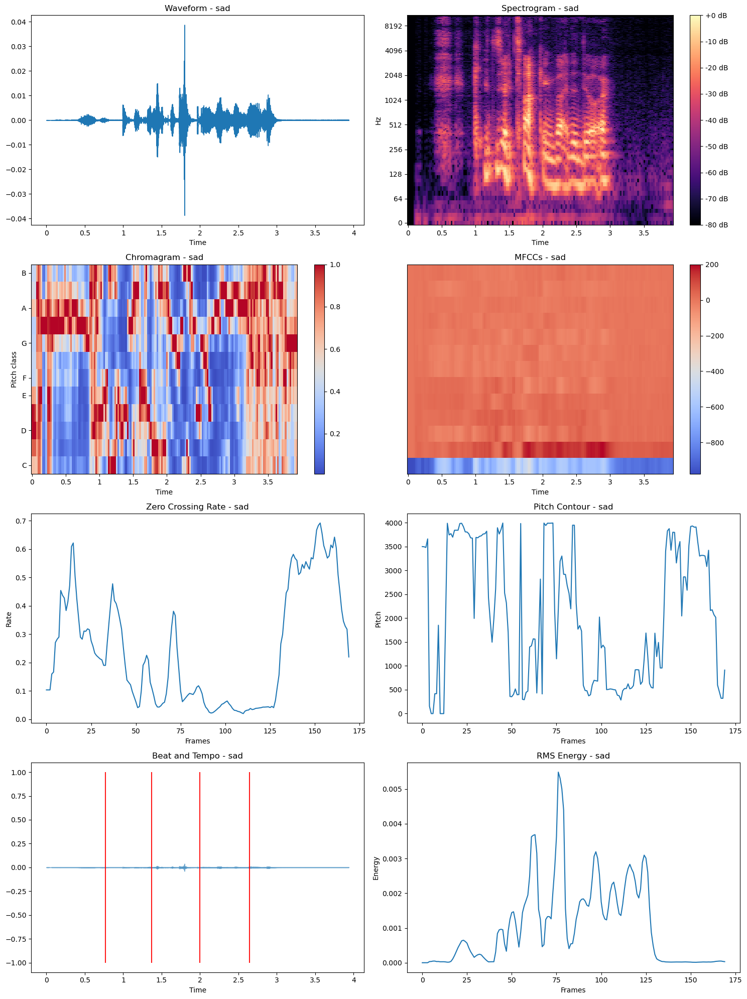

Visualizing features for angry emotion...


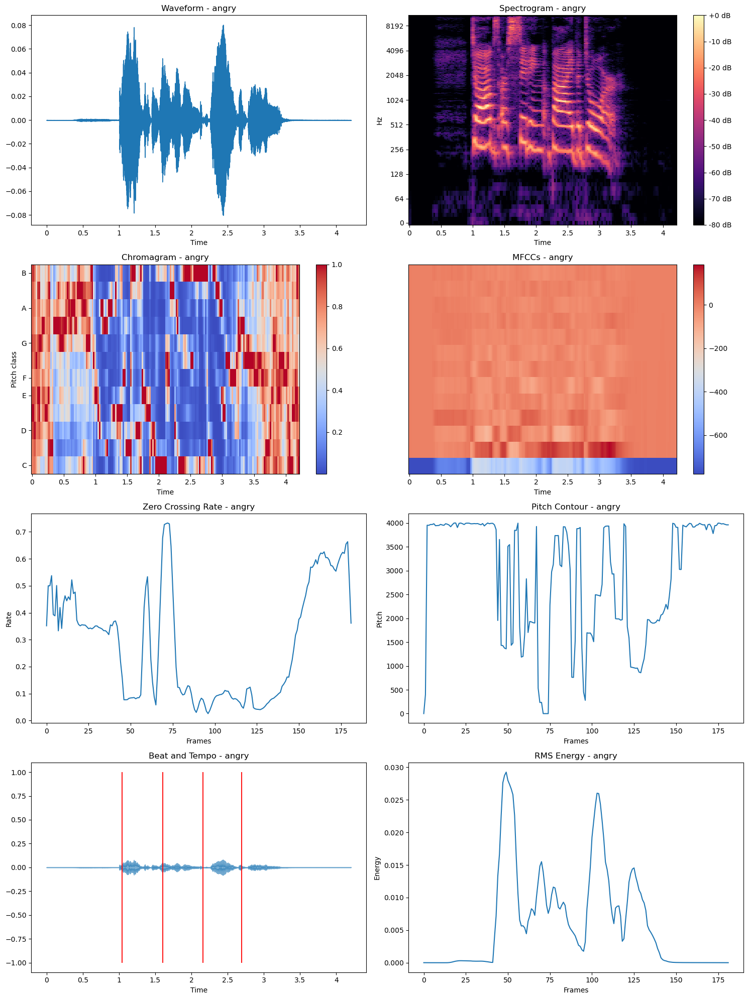

Visualizing features for fearful emotion...


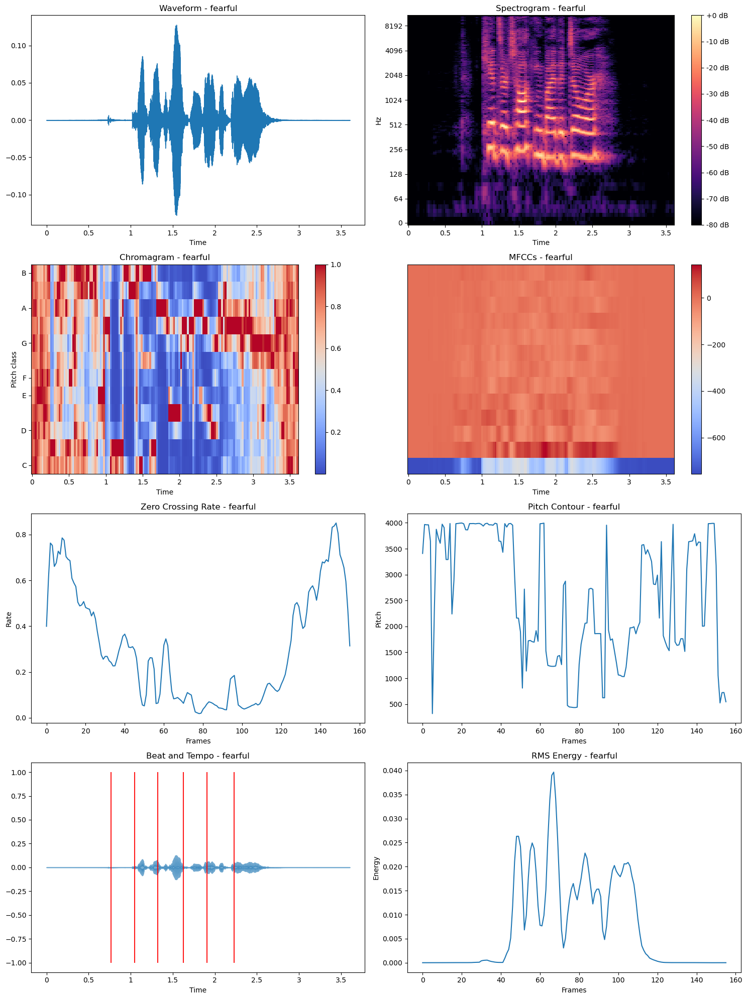

Visualizing features for disgust emotion...


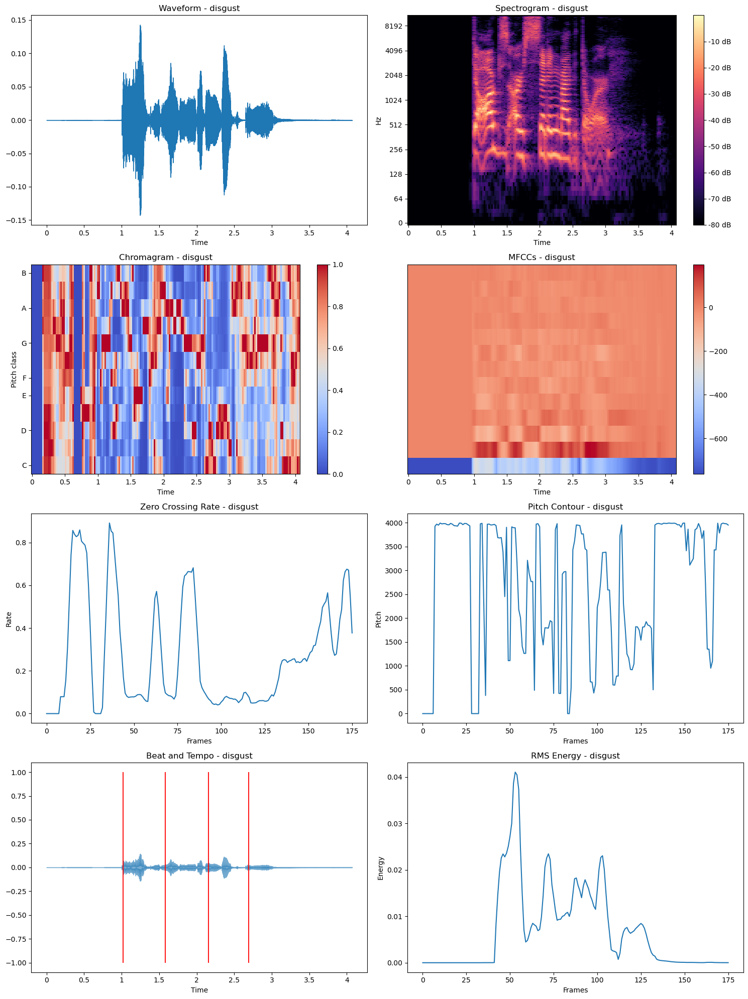

Visualizing features for surprised emotion...


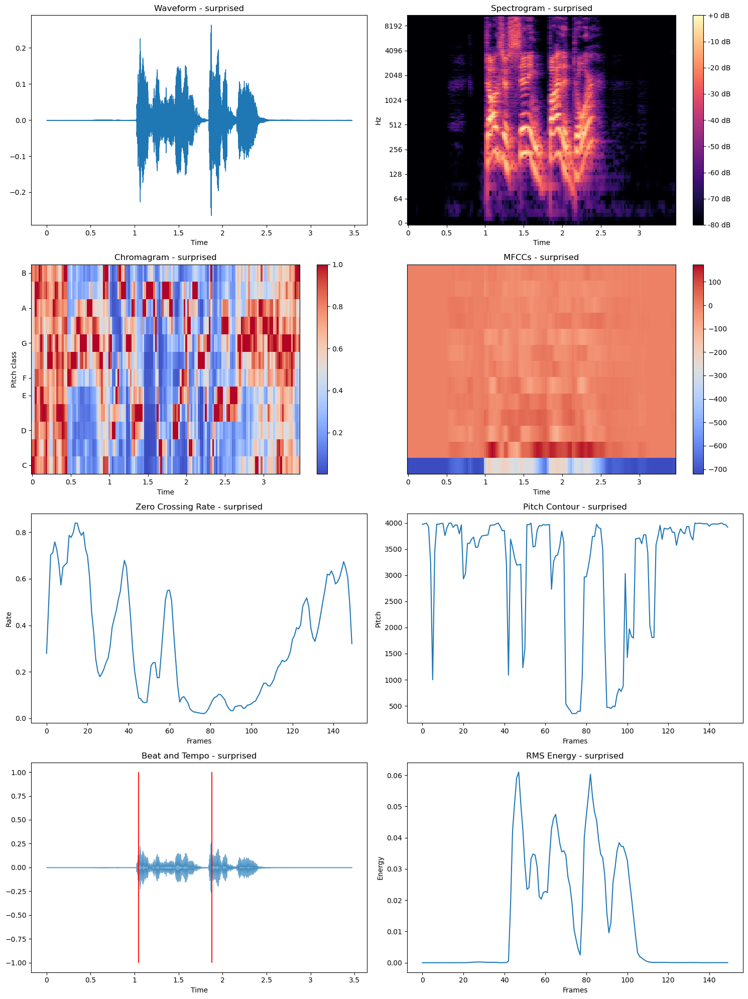

In [124]:
import librosa
import librosa.display
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd


# Function to plot audio features for each file
def plot_audio_features(file_path, emotion):
    y, sr = librosa.load(file_path)
    
    # Plotting all visualizations
    plt.figure(figsize=(15, 20))

    # 1. Waveform Plot
    plt.subplot(4, 2, 1)
    librosa.display.waveshow(y, sr=sr)
    plt.title(f'Waveform - {emotion}')

    # 2. Spectrogram
    plt.subplot(4, 2, 2)
    D = librosa.amplitude_to_db(np.abs(librosa.stft(y)), ref=np.max)
    librosa.display.specshow(D, sr=sr, x_axis='time', y_axis='log')
    plt.colorbar(format='%+2.0f dB')
    plt.title(f'Spectrogram - {emotion}')

    # 3. Chromagram
    plt.subplot(4, 2, 3)
    chroma = librosa.feature.chroma_stft(y=y, sr=sr)
    librosa.display.specshow(chroma, x_axis='time', y_axis='chroma', cmap='coolwarm')
    plt.colorbar()
    plt.title(f'Chromagram - {emotion}')

    # 4. MFCCs Plot
    plt.subplot(4, 2, 4)
    mfccs = librosa.feature.mfcc(y=y, sr=sr, n_mfcc=13)
    librosa.display.specshow(mfccs, x_axis='time')
    plt.colorbar()
    plt.title(f'MFCCs - {emotion}')

    # 5. Zero-Crossing Rate Plot
    plt.subplot(4, 2, 5)
    zcr = librosa.feature.zero_crossing_rate(y)
    plt.plot(zcr[0])
    plt.title(f'Zero Crossing Rate - {emotion}')
    plt.xlabel('Frames')
    plt.ylabel('Rate')

    # 6. Pitch Contour Plot
    pitches, magnitudes = librosa.core.piptrack(y=y, sr=sr)
    plt.subplot(4, 2, 6)
    plt.plot(np.max(pitches, axis=0))
    plt.title(f'Pitch Contour - {emotion}')
    plt.xlabel('Frames')
    plt.ylabel('Pitch')

    # 7. Beat and Tempo Plot
    plt.subplot(4, 2, 7)
    tempo, beats = librosa.beat.beat_track(y=y, sr=sr)
    plt.vlines(librosa.frames_to_time(beats), -1, 1, color='r', alpha=0.9)
    librosa.display.waveshow(y, sr=sr, alpha=0.6)
    plt.title(f'Beat and Tempo - {emotion}')

    # 8. RMS Energy Plot
    plt.subplot(4, 2, 8)
    rms = librosa.feature.rms(y=y)
    plt.plot(rms[0])
    plt.title(f'RMS Energy - {emotion}')
    plt.xlabel('Frames')
    plt.ylabel('Energy')

    plt.tight_layout()
    plt.show()

# Select one random audio file per unique emotion
unique_emotions = df['Emotion'].unique()
for emotion in unique_emotions:
    sample_row = df[df['Emotion'] == emotion].sample(n=1).iloc[0]
    file_path = sample_row['Speech']
    print(f'Visualizing features for {emotion} emotion...')
    plot_audio_features(file_path, emotion)


# AUTOMATED DATAGUMENTATION

# audiomentation for the minority class
*  the data in not balanced so we apply this technique to balance the dataset and improve the performance of machine learning models
* audiomentation techniques generate synthetic data by applying random transformations to existing samples, thereby increasing the diversity and quantity of data available for training.


* Select appropriate audiomentation techniques that are suitable for audio data. Common techniques incude:

1. Pitch Shifting: Change th(tone, sound)e pitch of the *audio.
2. Time Stretching: Stretch or compress the time domain of t( modify the speech of the audio)*
  -making the sporken sentance longer so speaker sound slowere4audio.
3. Noise Injectgaussandd random noise to th5 audio.
4. Speed Perturbation: Change the speed of the audio.

In [125]:
# example sample
def noise(data):
    noise_amp = 0.035*np.random.uniform()*np.amax(data)
    data = data + noise_amp*np.random.normal(size=data.shape[0])
    return data

def stretch(data, rate=0.8):
    return librosa.effects.time_stretch(data, rate = rate)

def shift(data):
    shift_range = int(np.random.uniform(low=-5, high = 5)*1000)
    return np.roll(data, shift_range)

def pitch(data, sampling_rate, pitch_factor=0.7):
    return librosa.effects.pitch_shift(data, sr=sampling_rate, n_steps=pitch_factor)

# taking any example and checking for techniques.
path = np.array(df['Speech'])[1]
data, sample_rate = librosa.load(path)

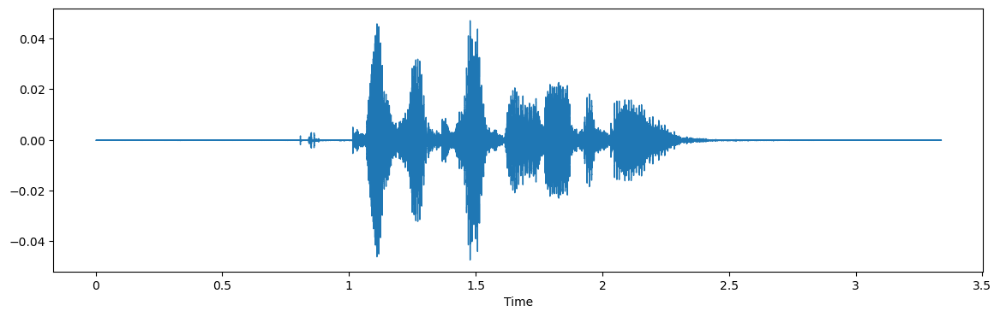

In [126]:
plt.figure(figsize=(14,4))
librosa.display.waveshow(y=data, sr=sample_rate)
ipd.Audio(path)

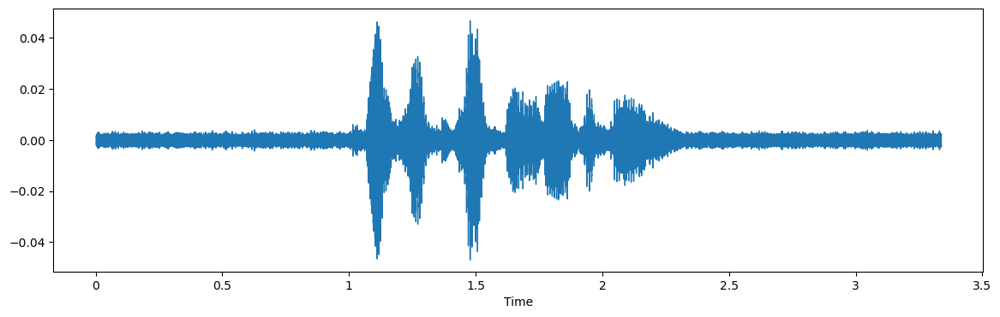

In [127]:
x = noise(data)
plt.figure(figsize=(14,4))
librosa.display.waveshow(y=x, sr=sample_rate)
ipd.Audio(x, rate=sample_rate)

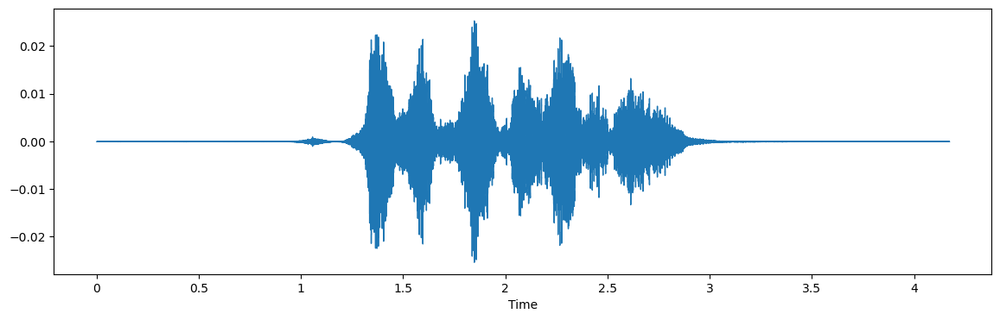

In [128]:
#stretching
x = stretch(data)
plt.figure(figsize=(14,4))
librosa.display.waveshow(y=x, sr=sample_rate)
ipd.Audio(x, rate=sample_rate)

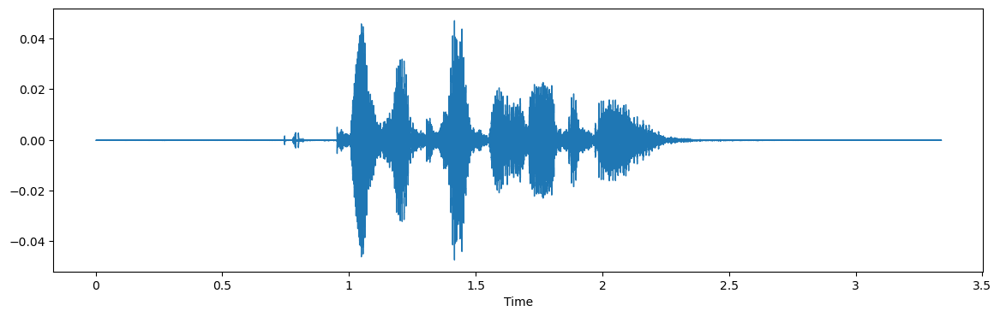

In [129]:
x = shift(data)
plt.figure(figsize=(14,4))
librosa.display.waveshow(y=x, sr=sample_rate)
ipd.Audio(x, rate=sample_rate)

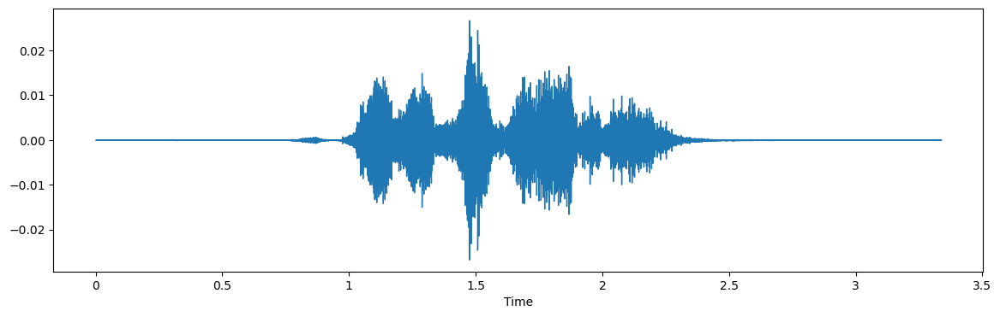

In [130]:
x = pitch(data,sample_rate)
plt.figure(figsize=(14,4))
librosa.display.waveshow(y=x, sr=sample_rate)
ipd.Audio(x, rate=sample_rate)

In [131]:
from audiomentations import Compose, AddGaussianNoise, TimeStretch, PitchShift, Shift
import soundfile as sf

# Function to load audio file
def load_audio(audio_path):
    y, sr = librosa.load(audio_path, sr=None)
    return y, sr

# Define audiomentation pipeline
augment = Compose([
    AddGaussianNoise(min_amplitude=0.001, max_amplitude=0.015, p=0.5),
    TimeStretch(min_rate=0.8, max_rate=1.25, p=0.5),
    PitchShift(min_semitones=-4, max_semitones=4, p=0.5),
    Shift(min_shift=-0.5, max_shift=0.5, p=0.5)  
])

# Function to apply augmentation
def augment_audio(y, sr, augment):
    augmented_samples = augment(samples=y, sample_rate=sr)
    return augmented_samples

# Determine how many more samples are needed for the 'neutral' class
target_count = 192
current_count = df[df['Emotion'] == 'neutral'].shape[0]
additional_samples_needed = target_count - current_count

# Apply augmentation to the 'neutral' class
augmented_data = []
neutral_samples = df[df['Emotion'] == 'neutral']

for i in range(additional_samples_needed):
    idx = i % neutral_samples.shape[0]
    row = neutral_samples.iloc[idx]
    audio_path = row['Speech']
    emotion = row['Emotion']
    y, sr = load_audio(audio_path)
    augmented_y = augment_audio(y, sr, augment)
    
    # Save the augmented audio
    augmented_audio_path = f"augmented_neutral_{i}.wav"
    sf.write(augmented_audio_path, augmented_y, sr)
    
    augmented_data.append([augmented_audio_path, emotion])

# Create a new dataframe with augmented data
augmented_df = pd.DataFrame(augmented_data, columns=['Speech', 'Emotion'])

# Concatenate the original dataframe with the augmented dataframe
balanced_df = pd.concat([df, augmented_df], ignore_index=True)

# Verify the new class distribution
print(balanced_df['Emotion'].value_counts())


Emotion
neutral      192
calm         192
happy        192
sad          192
angry        192
fearful      192
disgust      192
surprised    192
Name: count, dtype: int64


In [132]:
balanced_df.shape

(1536, 2)

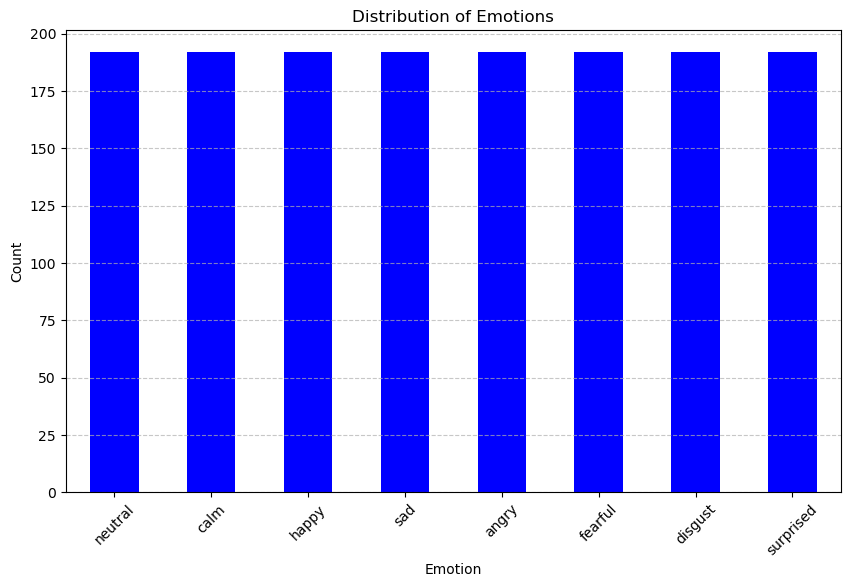

In [133]:
# Plot a bar chart for the distribution of emotions
plt.figure(figsize=(10, 6))
balanced_df['Emotion'].value_counts().plot(kind='bar', color='blue')
plt.title('Distribution of Emotions')
plt.xlabel('Emotion')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

In [134]:
balanced_df['Emotion'].value_counts()

Emotion
neutral      192
calm         192
happy        192
sad          192
angry        192
fearful      192
disgust      192
surprised    192
Name: count, dtype: int64

In [135]:
# Get a concise summary of the DataFrame
print("DataFrame summary:")
print(balanced_df.info())


DataFrame summary:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1536 entries, 0 to 1535
Data columns (total 2 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   Speech   1536 non-null   object
 1   Emotion  1536 non-null   object
dtypes: object(2)
memory usage: 24.1+ KB
None


In [136]:
balanced_df.head()

,Speech,Emotion
0,c:\Users\admin\OneDrive - Sol Plaatje Universi...,neutral
1,c:\Users\admin\OneDrive - Sol Plaatje Universi...,neutral
2,c:\Users\admin\OneDrive - Sol Plaatje Universi...,neutral
3,c:\Users\admin\OneDrive - Sol Plaatje Universi...,neutral
4,c:\Users\admin\OneDrive - Sol Plaatje Universi...,calm






# **DATA PREPARATION**



In [137]:
def noise(data):
    noise_amp = 0.03 * np.random.uniform() * np.amax(data)
    data = data + noise_amp * np.random.normal(size=data.shape[0])
    return data

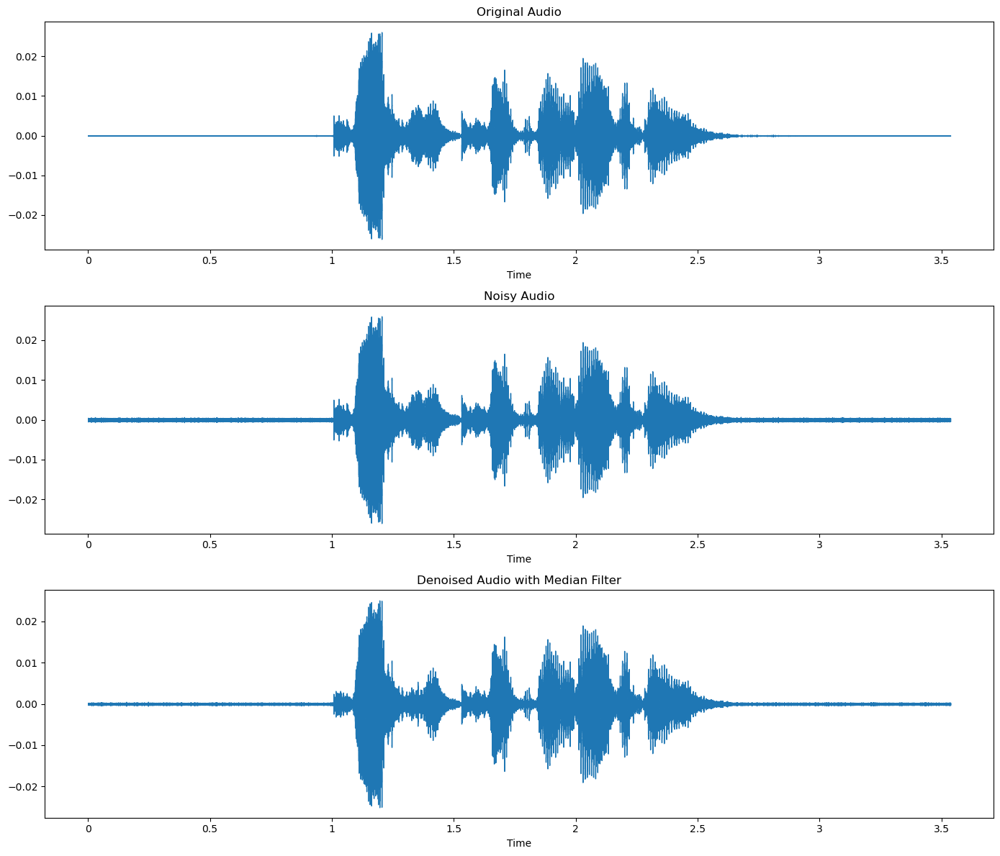

In [138]:
from scipy.signal import medfilt
# Function to add noise to audio


# Function to apply median filter for denoising
def median_filt(y, kernel_size=3):
    return medfilt(y, kernel_size)

path = np.array(df['Speech'])[4]
y, sr = librosa.load(path)

# Add noise to the audio
noisy_y = noise(y)

# Apply median filter to denoise the audio
denoised_y = median_filt(noisy_y, kernel_size=3)

# Plot the original, noisy, and denoised audio waveforms
plt.figure(figsize=(14, 12))

# Plot original audio
plt.subplot(3, 1, 1)
librosa.display.waveshow(y, sr=sr)
plt.title('Original Audio')

# Plot noisy audio
plt.subplot(3, 1, 2)
librosa.display.waveshow(noisy_y, sr=sr)
plt.title('Noisy Audio')

# Plot denoised audio
plt.subplot(3, 1, 3)
librosa.display.waveshow(denoised_y, sr=sr)
plt.title('Denoised Audio with Median Filter')

plt.tight_layout()
plt.show()

# Best Filter: 
Median Filter will be use to denise the audion data as it minimizes the loss of information


# 1. DENOISING USING MEDIAM FILTER

In [139]:
from scipy.ndimage import median_filter

# Function to load audio
def load_audio(audio_path):
    y, sr = librosa.load(audio_path, sr=None)
    return y, sr

# Function to apply median filter
def median_filt(y, kernel_size):
    return median_filter(y, size=kernel_size)

# Create a directory for the denoised audio if it doesn't exist
denoised_audio_dir = 'denoised_audio'
os.makedirs(denoised_audio_dir, exist_ok=True)

# Load your balanced dataframe
df = balanced_df

# Apply denoising to all audio files in the dataframe
denoised_data = []

for idx, row in df.iterrows():
    audio_path = row['Speech']
    emotion = row['Emotion']
    y, sr = load_audio(audio_path)
    
    # Apply median filter
    denoised_y = median_filt(y, kernel_size=3)
    
    # Extract the filename without extension
    file_name = os.path.basename(audio_path)
    name_without_ext, _ = os.path.splitext(file_name)
    
    # Define the path for the denoised audio file
    denoised_audio_path = os.path.join( f"{name_without_ext}_denoised.wav")
    
    # Save the denoised audio
    sf.write(denoised_audio_path, denoised_y, sr)
    
    denoised_data.append([denoised_audio_path, emotion])

# Create a new dataframe with denoised data
denoised_df = pd.DataFrame(denoised_data, columns=['Speech', 'Emotion'])


In [140]:
# Save the denoised dataframe to a CSV file
denoised_df.to_csv('denoised_audio_dataset.csv', index=False)

# Verify the class distribution (optional)
print(denoised_df['Emotion'].value_counts())

Emotion
neutral      192
calm         192
happy        192
sad          192
angry        192
fearful      192
disgust      192
surprised    192
Name: count, dtype: int64


In [141]:
df = pd.read_csv('denoised_audio_dataset.csv')

In [142]:
denoised_df.head()

,Speech,Emotion
0,03-01-01-01-01-01-01_denoised.wav,neutral
1,03-01-01-01-01-02-01_denoised.wav,neutral
2,03-01-01-01-02-01-01_denoised.wav,neutral
3,03-01-01-01-02-02-01_denoised.wav,neutral
4,03-01-02-01-01-01-01_denoised.wav,calm


In [143]:
df.head()

,Speech,Emotion
0,03-01-01-01-01-01-01_denoised.wav,neutral
1,03-01-01-01-01-02-01_denoised.wav,neutral
2,03-01-01-01-02-01-01_denoised.wav,neutral
3,03-01-01-01-02-02-01_denoised.wav,neutral
4,03-01-02-01-01-01-01_denoised.wav,calm


In [251]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1536 entries, 0 to 1535
Data columns (total 2 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   Speech   1536 non-null   object
 1   Emotion  1536 non-null   object
dtypes: object(2)
memory usage: 24.1+ KB


# NORMALIZATION 

*By using frequency domain features, you can gain a deeper understanding of the audio characteristics and improve the performance of various audio and *speech processing tasks.

*Analyzing speech signals in the frequency domain often provides more insight into the characteristics of the audio, as many speech features are more easily observed and interpreted in this domain. Some common frequency domain features used in speech analysis include Mel-Frequency Cepstral Coefficients (MFCCs), Spectrograms, and Chroma features.

*1. Mel-Frequency Cepstral Coefficients (MFCCs)
MFCCs are a representation of the short-term power spectrum of a sound, commonly used in speech and audio processing.

2. Spectrogram
A spectrogram is a visual representation of the spectrum of frequencies in a sound signal as they vary with time.

3. Chroma Features
Chroma features represent the 12 different pitch classes and are often used in music analysis, but they can also be useful for speech analysis.


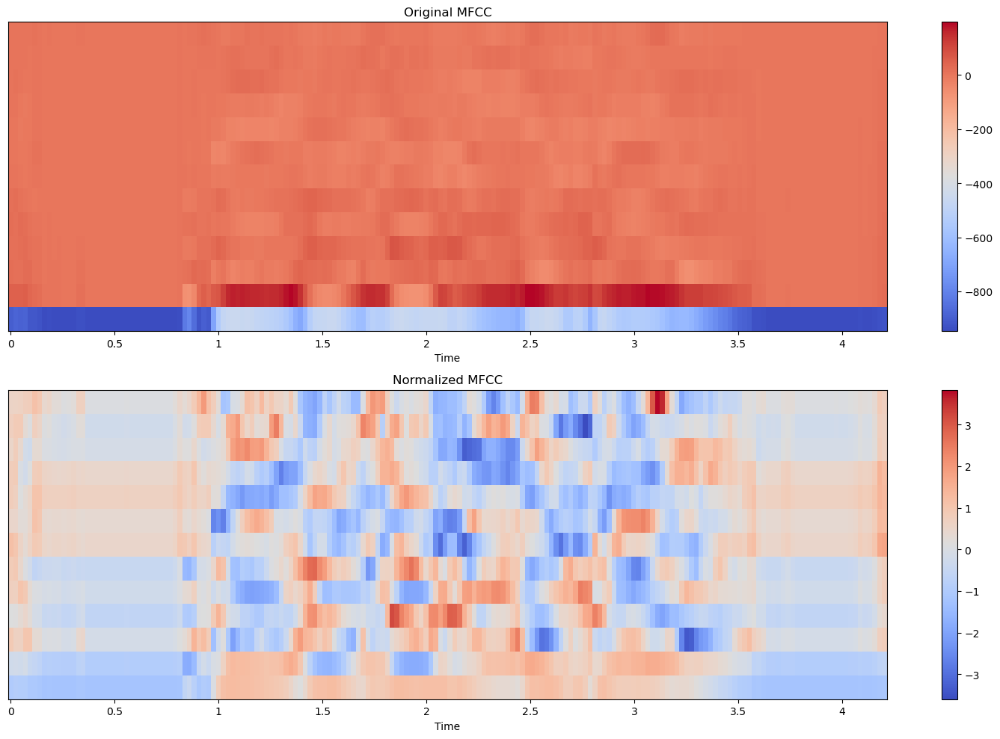

Original MFCCs shape: (13, 182)
Normalized MFCCs shape: (13, 182)
Original MFCCs (first 5 values):
 [[-8.9808185e+02 -8.8179877e+02 -8.8952393e+02 -8.8840509e+02
  -9.1715649e+02]
 [ 4.9000504e+01  5.1296051e+01  4.9113335e+01  5.5608093e+01
   3.4465164e+01]
 [ 2.0356688e+01  1.5378905e+01  1.5906996e+01  2.2237524e+01
   2.2577782e+01]
 [ 1.3492111e+01  1.4000216e+01  1.7363884e+01  2.1070917e+01
   1.6330370e+01]
 [ 1.6931492e+01  1.6154823e+01  2.2781708e+01  2.0371536e+01
   1.0053326e+01]
 [ 1.5780672e+01  1.6887619e+01  1.1154795e+01  6.2001390e+00
   3.0219045e+00]
 [ 7.6313701e+00  6.2414074e+00  1.2719636e+00 -1.8029578e+00
   1.3696949e+00]
 [ 1.5995346e+00  1.8210623e+00 -1.3571991e+00 -1.2883652e+00
   1.3789607e+00]
 [ 1.5736554e+00  2.3570055e-01 -7.6600156e+00 -4.9753361e+00
  -1.8912956e+00]
 [ 3.2498498e+00  3.7431407e+00 -4.7730045e+00 -6.8230414e+00
  -3.7083514e+00]
 [ 6.4354858e+00  9.1830893e+00  5.7323527e+00 -5.3356552e-01
  -1.2573345e+00]
 [ 6.4026361e+00  7.

In [144]:
from sklearn.preprocessing import StandardScaler

path = np.array(df['Speech'])[10]
y, sr = librosa.load(path)

# Function to extract MFCCs
def extract_mfcc(y, sr, n_mfcc=13):
    mfccs = librosa.feature.mfcc(y=y, sr=sr, n_mfcc=n_mfcc)
    return mfccs

# Function to normalize MFCCs using StandardScaler
def normalize(mfccs):
    scaler = StandardScaler()
    mfccs_scaled = scaler.fit_transform(mfccs.T).T  # Transpose to fit the scaler and then transpose back
    return mfccs_scaled

# Extract MFCCs
mfccs = extract_mfcc(y, sr)

# Normalize MFCCs
mfccs_normalized = normalize(mfccs)

# Plot the original and normalized MFCCs
plt.figure(figsize=(15, 10))

# Plot original MFCCs
plt.subplot(2, 1, 1)
librosa.display.specshow(mfccs, sr=sr, x_axis='time')
plt.colorbar()
plt.title('Original MFCC')

# Plot normalized MFCCs
plt.subplot(2, 1, 2)
librosa.display.specshow(mfccs_normalized, sr=sr, x_axis='time')
plt.colorbar()
plt.title('Normalized MFCC')

plt.tight_layout()
plt.show()

# Print out the shapes and first few values of original and normalized MFCCs for comparison
print("Original MFCCs shape:", mfccs.shape)
print("Normalized MFCCs shape:", mfccs_normalized.shape)
print("Original MFCCs (first 5 values):\n", mfccs[:, :5])
print("Normalized MFCCs (first 5 values):\n", mfccs_normalized[:, :5])


#  FEATURE EXTRACTION

In [145]:

# Modify the extract_features function to also return labels
def extract_features(data, sample_rate):
    result = np.array([])
    labels = []

    # Zero-Crossing Rate
    zcr = np.mean(librosa.feature.zero_crossing_rate(y=data).T, axis=0)
    result = np.hstack((result, zcr))
    labels.append('zero_crossing_rate')

    # Chroma STFT
    stft = np.abs(librosa.stft(data))
    chroma_stft = np.mean(librosa.feature.chroma_stft(S=stft, sr=sample_rate).T, axis=0)
    result = np.hstack((result, chroma_stft))
    labels.extend([f'chroma_stft_{i}' for i in range(chroma_stft.shape[0])])

    # MFCC
    mfcc = np.mean(librosa.feature.mfcc(y=data, sr=sample_rate, n_mfcc=40).T, axis=0)
    result = np.hstack((result, mfcc))
    labels.extend([f'mfcc_{i}' for i in range(mfcc.shape[0])])

    # Root Mean Square
    rms = np.mean(librosa.feature.rms(y=data).T, axis=0)
    result = np.hstack((result, rms))
    labels.append('rms')

    # Mel Spectrogram
    mel = np.mean(librosa.feature.melspectrogram(y=data, sr=sample_rate).T, axis=0)
    result = np.hstack((result, mel))
    labels.extend([f'mel_{i}' for i in range(mel.shape[0])])

    # Prosodic Features
    # 1. Pitch
    pitches, magnitudes = librosa.piptrack(y=data, sr=sample_rate)
    pitch = np.nanmean([np.mean(pitch[pitch > 0]) for pitch in pitches.T])
    result = np.hstack((result, pitch))
    labels.append('pitch')

    # 2. Energy
    energy = np.sum(librosa.feature.rms(y=data).T, axis=0)
    result = np.hstack((result, energy))
    labels.append('energy')

    # 3. Duration
    duration = len(data) / sample_rate
    result = np.hstack((result, duration))
    labels.append('duration')

    return result, labels

# Function to extract features with augmentation
def get_features_with_augmentation(audio_path):
    
    # Load audio and convert to floating-point format
    data, sample_rate = librosa.load(audio_path, duration=2.5, offset=0.6)
    data = data.astype(np.float32)

    # Extract features from the original audio
    res1, labels = extract_features(data, sample_rate)
    result = np.array(res1)

    # Augment data by adding noise
    noise_data = noise(data)
    res2, _ = extract_features(noise_data, sample_rate)
    result = np.vstack((result, res2))

    # Augment data by stretching
    stretched_data = stretch(data,rate=0.8)
    res3, _ = extract_features(stretched_data, sample_rate)
    result = np.vstack((result, res3))

    # Augment data by pitch shifting
    pitch_data = pitch(data, sample_rate)
    res4, _ = extract_features(pitch_data, sample_rate)
    result = np.vstack((result, res4))

    # Convert result to DataFrame
    features_df = pd.DataFrame(result, columns=labels)
    
    return features_df




In [146]:
# Load the denoised dataset
denoised_df = pd.read_csv('denoised_audio_dataset.csv')
X, Y = [], []

# Extract features and emotions
for path, emotion in zip(denoised_df.Speech, denoised_df.Emotion):
    # Get the features DataFrame for the audio file with augmentations
    features_df = get_features_with_augmentation(path)
    
    # Append each row of features and the corresponding emotion label
    for _, feature_row in features_df.iterrows():
        X.append(feature_row.values)  # Convert row to array and append to X
        Y.append(emotion)  # Append the emotion label to Y

# Convert X to a DataFrame
X_df = pd.DataFrame(X)

# Create a final DataFrame that includes features and their corresponding labels
final_df = pd.DataFrame(X, columns=features_df.columns)  # Use the same column names as features_df
final_df['Emotion'] = Y  # Add the emotion labels

# Save the final DataFrame to a CSV file
final_df.to_csv('extracted_features_with_labels.csv', index=False)




c:\Users\admin\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
c:\Users\admin\anaconda3\Lib\site-packages\numpy\core\_methods.py:129: RuntimeWarning: invalid value encountered in divide
  ret = ret.dtype.type(ret / rcount)
c:\Users\admin\anaconda3\Lib\site-packages\numpy\core\_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


In [147]:
final_df.head()

,zero_crossing_rate,chroma_stft_0,chroma_stft_1,chroma_stft_2,chroma_stft_3,chroma_stft_4,chroma_stft_5,chroma_stft_6,chroma_stft_7,chroma_stft_8,...,mel_122,mel_123,mel_124,mel_125,mel_126,mel_127,pitch,energy,duration,Emotion
0,0.326416,0.741282,0.739948,0.715356,0.726539,0.693818,0.663530,0.695558,0.735384,0.751350,...,1.612789e-06,2.945220e-06,0.000005,0.000004,0.000002,1.895963e-07,1248.892212,0.321961,2.500000,neutral
1,0.310325,0.772290,0.830052,0.801628,0.791400,0.812645,0.730210,0.662439,0.704557,0.752261,...,3.699190e-05,3.693417e-05,0.000038,0.000041,0.000039,3.464979e-05,1583.915570,0.358683,2.500000,neutral
2,0.175250,0.695322,0.748651,0.716307,0.681422,0.678472,0.643956,0.654927,0.696589,0.705649,...,6.689573e-07,1.424551e-06,0.000002,0.000002,0.000001,9.805644e-08,1218.593018,0.275563,3.124989,neutral
3,0.175637,0.668272,0.713752,0.764915,0.721684,0.680005,0.684769,0.660719,0.676079,0.706635,...,1.688137e-06,9.080778e-07,0.000002,0.000003,0.000002,1.085064e-07,1282.276978,0.239171,2.500000,neutral
4,0.277000,0.683592,0.730139,0.717206,0.685079,0.682584,0.684100,0.641699,0.695920,0.722635,...,4.689035e-06,6.663165e-06,0.000005,0.000006,0.000003,1.961947e-07,1268.120117,0.347606,2.500000,neutral


In [148]:
final_df.columns


Index(['zero_crossing_rate', 'chroma_stft_0', 'chroma_stft_1', 'chroma_stft_2',
       'chroma_stft_3', 'chroma_stft_4', 'chroma_stft_5', 'chroma_stft_6',
       'chroma_stft_7', 'chroma_stft_8',
       ...
       'mel_122', 'mel_123', 'mel_124', 'mel_125', 'mel_126', 'mel_127',
       'pitch', 'energy', 'duration', 'Emotion'],
      dtype='object', length=186)

In [149]:
len(X), len(Y), denoised_df['Speech'].shape

(6144, 6144, (1536,))

In [150]:
X = final_df.iloc[: ,:-1].values
Y = final_df['Emotion'].values

In [151]:
from sklearn.preprocessing import StandardScaler, OneHotEncoder
encoder = OneHotEncoder()
Y = encoder.fit_transform(np.array(Y).reshape(-1,1)).toarray()

In [152]:
print(Y.shape)
X.shape

(6144, 8)


(6144, 185)

In [153]:
from sklearn.model_selection import train_test_split

# Split the data into training and testing sets
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=42,shuffle=True)

X_train.shape, Y_train.shape, Y_test.shape, Y_test.shape


((4915, 185), (4915, 8), (1229, 8), (1229, 8))

In [154]:
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)
X_train.shape, Y_train.shape, X_test.shape, Y_test.shape

((4915, 185), (4915, 8), (1229, 185), (1229, 8))

In [155]:
x_train =np.expand_dims(X_train, axis=2)
x_test= np.expand_dims(X_test, axis=2)
x_train.shape, Y_train.shape, x_test.shape, Y_test.shape

((4915, 185, 1), (4915, 8), (1229, 185, 1), (1229, 8))

# CNN-LSTM

In [156]:
import tensorflow as tf
from tensorflow.keras.layers import Conv1D, BatchNormalization, MaxPooling1D, Dropout, Flatten, Dense, LSTM, Reshape, Attention, Input

# Define the model
input_shape = (X_train.shape[1], 1)
inputs = Input(shape=input_shape)

# Convolutional Layers
x = Conv1D(512, kernel_size=5, strides=1, padding='same', activation='relu')(inputs)
x = BatchNormalization()(x)
x = MaxPooling1D(pool_size=5, strides=2, padding='same')(x)

x = Conv1D(512, kernel_size=5, strides=1, padding='same', activation='relu')(x)
x = BatchNormalization()(x)
x = MaxPooling1D(pool_size=5, strides=2, padding='same')(x)
x = Dropout(0.2)(x)

x = Conv1D(256, kernel_size=5, strides=1, padding='same', activation='relu')(x)
x = BatchNormalization()(x)
x = MaxPooling1D(pool_size=5, strides=2, padding='same')(x)

x = Conv1D(256, kernel_size=3, strides=1, padding='same', activation='relu')(x)
x = BatchNormalization()(x)
x = MaxPooling1D(pool_size=5, strides=2, padding='same')(x)
x = Dropout(0.2)(x)

x = Conv1D(128, kernel_size=3, strides=1, padding='same', activation='relu')(x)
x = BatchNormalization()(x)
x = MaxPooling1D(pool_size=3, strides=2, padding='same')(x)
x = Dropout(0.2)(x)

# Reshape output to fit LSTM input requirements
x = Reshape((-1, 128))(x)  # Change this to match your specific output dimensions

# LSTM layer
lstm_out = LSTM(128, return_sequences=True)(x)  # Keep return_sequences=True for attention layer

# Attention Layer
attention_out = Attention()([lstm_out, lstm_out])  # Self-attention

# Flattening the output from the attention layer
x = Flatten()(attention_out)

# Dense Layers
x = Dense(512, activation='relu')(x)
x = BatchNormalization()(x)
x = Dropout(0.5)(x)  # Increased dropout for dense layer
outputs = Dense(8, activation='softmax')(x)

# Define the complete model
model = tf.keras.Model(inputs, outputs)

# Compile the model
model.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['accuracy'])

# Print model summary
model.summary()


Model: "functional_7"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_3       │ (None, 185, 1)    │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_5 (Conv1D)   │ (None, 185, 512)  │      3,072 │ input_layer_3[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 185, 512)  │      2,048 │ conv1d_5[0][0]    │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_5     │ (None, 93, 512)   │          0 │ batch_normalizat… │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_6 (Conv1D)   │ (None, 93, 512)   │  1,311,232 │ max_pooling1d_5[… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 93, 512)   │      2,048 │ conv1d_6[0][0]    │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_6     │ (None, 47, 512)   │          0 │ batch_normalizat… │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_4 (Dropout) │ (None, 47, 512)   │          0 │ max_pooling1d_6[… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_7 (Conv1D)   │ (None, 47, 256)   │    655,616 │ dropout_4[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 47, 256)   │      1,024 │ conv1d_7[0][0]    │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_7     │ (None, 24, 256)   │          0 │ batch_normalizat… │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_8 (Conv1D)   │ (None, 24, 256)   │    196,864 │ max_pooling1d_7[… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 24, 256)   │      1,024 │ conv1d_8[0][0]    │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_8     │ (None, 12, 256)   │          0 │ batch_normalizat… │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_5 (Dropout) │ (None, 12, 256)   │          0 │ max_pooling1d_8[… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_9 (Conv1D)   │ (None, 12, 128)   │     98,432 │ dropout_5[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 12, 128)   │        512 │ conv1d_9[0][0]    │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_9     │ (None, 6, 128)    │          0 │ batch_normalizat… │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_6 (Dropout) │ (None, 6, 128)    │          0 │ max_pooling1d_9[… │
├─────────────────────┼───────────────────┼────────────┼─────────────────

 Total params: 2,803,336 (10.69 MB)

 Trainable params: 2,798,984 (10.68 MB)

 Non-trainable params: 4,352 (17.00 KB)

In [157]:
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau

# Define callbacks
model_checkpoint = ModelCheckpoint(
    'best_model1.keras',               # Save the entire model with .keras extension
    monitor='val_accuracy',           # Monitor validation accuracy
    save_best_only=True,               # Save only the best model
    mode='max',                       # Mode should be 'max' for accuracy
    save_weights_only=False,           # Save the entire model, not just weights
    verbose=1                         # Verbose output
)

early_stop = EarlyStopping(
    monitor='val_accuracy',           # Monitor validation accuracy
    mode='max',                       # Mode should be 'max' for accuracy
    patience=5,                       # Number of epochs with no improvement to wait
    restore_best_weights=True         # Restore the best weights
)

lr_reduction = ReduceLROnPlateau(
    monitor='val_accuracy',           # Monitor validation accuracy
    patience=3,                       # Number of epochs with no improvement to wait
    verbose=1,                        # Verbose output
    factor=0.5,                       # Reduce learning rate by this factor
    min_lr=0.00001                    # Minimum learning rate
)


In [158]:
# Train the model with callbacks
history=model.fit(x_train, Y_train, epochs=100, validation_data=(x_test, Y_test), batch_size=64,callbacks=[early_stop,lr_reduction,model_checkpoint])


Epoch 1/100
77/77 ━━━━━━━━━━━━━━━━━━━━ 0s 450ms/step - accuracy: 0.2375 - loss: 2.5528
Epoch 1: val_accuracy improved from -inf to 0.17575, saving model to best_model1.keras
77/77 ━━━━━━━━━━━━━━━━━━━━ 49s 490ms/step - accuracy: 0.2379 - loss: 2.5494 - val_accuracy: 0.1758 - val_loss: 2.0928 - learning_rate: 0.0010
Epoch 2/100
77/77 ━━━━━━━━━━━━━━━━━━━━ 0s 445ms/step - accuracy: 0.3459 - loss: 1.8890
Epoch 2: val_accuracy did not improve from 0.17575
77/77 ━━━━━━━━━━━━━━━━━━━━ 36s 472ms/step - accuracy: 0.3458 - loss: 1.8888 - val_accuracy: 0.1155 - val_loss: 2.6219 - learning_rate: 0.0010
Epoch 3/100
77/77 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step - accuracy: 0.3732 - loss: 1.7523
Epoch 3: val_accuracy did not improve from 0.17575
77/77 ━━━━━━━━━━━━━━━━━━━━ 36s 464ms/step - accuracy: 0.3734 - loss: 1.7520 - val_accuracy: 0.1180 - val_loss: 2.8316 - learning_rate: 0.0010
Epoch 4/100
77/77 ━━━━━━━━━━━━━━━━━━━━ 0s 439ms/step - accuracy: 0.4058 - loss: 1.6376
Epoch 4: ReduceLROnPlateau reducing l

In [159]:
from tensorflow.keras.models import load_model

# Load the best model saved during training
model = load_model('best_model1.keras')


In [160]:

# Evaluate the model
# Evaluate the model
test_acc2 = model.evaluate(x_test, Y_test)[1] * 100
print(f"Test accuracy: {test_acc2:.2f}%")


# Evaluate the model on the train set
train_loss, train_acc = model.evaluate(x_train, Y_train, verbose=0)
print(f"Train accuracy: {train_acc * 100:.2f}%")

39/39 ━━━━━━━━━━━━━━━━━━━━ 4s 54ms/step - accuracy: 0.9080 - loss: 0.4215
Test accuracy: 89.02%
Train accuracy: 100.00%


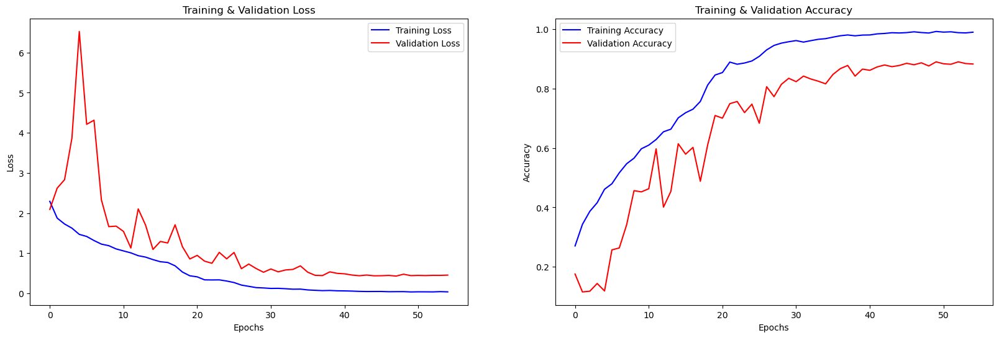

In [161]:

epochs = range(len(history.history['accuracy']))  # Automatically infer the number of epochs

fig, ax = plt.subplots(1, 2, figsize=(20, 6))  # You can directly set figsize here

# Retrieve training and validation accuracy/loss
train_acc = history.history['accuracy']
train_loss = history.history['loss']
test_acc = history.history['val_accuracy']
test_loss = history.history['val_loss']

# Plot training & validation loss
ax[0].plot(epochs, train_loss, label='Training Loss', color='blue')
ax[0].plot(epochs, test_loss, label='Validation Loss', color='red')
ax[0].set_title('Training & Validation Loss')
ax[0].set_xlabel("Epochs")
ax[0].set_ylabel("Loss")
ax[0].legend()

# Plot training & validation accuracy
ax[1].plot(epochs, train_acc, label='Training Accuracy', color='blue')
ax[1].plot(epochs, test_acc, label='Validation Accuracy', color='red')
ax[1].set_title('Training & Validation Accuracy')
ax[1].set_xlabel("Epochs")
ax[1].set_ylabel("Accuracy")
ax[1].legend()

plt.show()


In [162]:
# predicting on test data.
pred_test0 = model.predict(x_test)
y_pred0 = encoder.inverse_transform(pred_test0)
y_test0 = encoder.inverse_transform(Y_test)

39/39 ━━━━━━━━━━━━━━━━━━━━ 3s 69ms/step


In [163]:
# Check for random predictions
df0 = pd.DataFrame(columns=['Predicted Labels', 'Actual Labels'])
df0['Predicted Labels'] = y_pred0.flatten()
df0['Actual Labels'] = y_test0.flatten()


In [164]:
df0

,Predicted Labels,Actual Labels
0,fearful,fearful
1,happy,happy
2,angry,angry
3,calm,calm
4,calm,calm
...,...,...
1224,fearful,fearful
1225,fearful,disgust
1226,sad,sad
1227,calm,calm


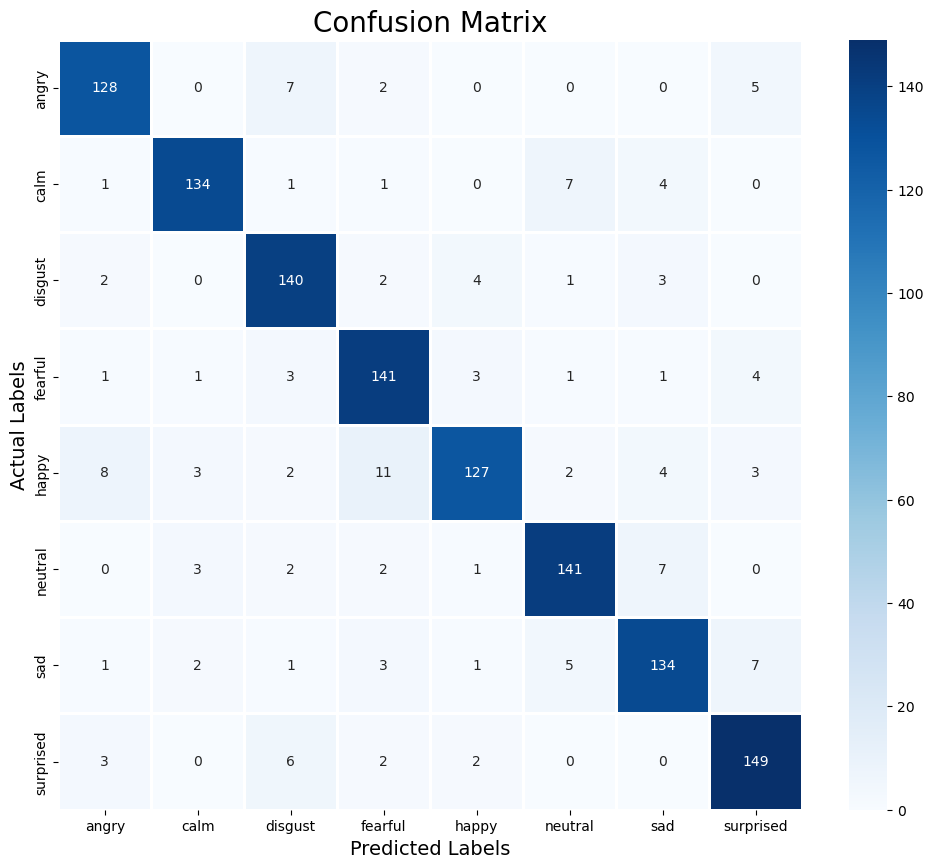

              precision    recall  f1-score   support

       angry       0.89      0.90      0.90       142
        calm       0.94      0.91      0.92       148
     disgust       0.86      0.92      0.89       152
     fearful       0.86      0.91      0.88       155
       happy       0.92      0.79      0.85       160
     neutral       0.90      0.90      0.90       156
         sad       0.88      0.87      0.87       154
   surprised       0.89      0.92      0.90       162

    accuracy                           0.89      1229
   macro avg       0.89      0.89      0.89      1229
weighted avg       0.89      0.89      0.89      1229



In [165]:
from sklearn.metrics import confusion_matrix, classification_report
cm = confusion_matrix(y_test0, y_pred0)
plt.figure(figsize = (12, 10))
cm = pd.DataFrame(cm , index = [i for i in encoder.categories_] , columns = [i for i in encoder.categories_])


sns.heatmap(cm, linecolor='white', cmap='Blues', linewidth=1, annot=True, fmt='.0f')
plt.title('Confusion Matrix', size=20)
plt.xlabel('Predicted Labels', size=14)
plt.ylabel('Actual Labels', size=14)
plt.show()
print(classification_report(y_test0, y_pred0))



# CNN-LSTM model predicton 

In [166]:
# Feature Extraction Function  
def extract_features(data, sample_rate):
    result = np.array([])

    # Zero-Crossing Rate
    zcr = np.mean(librosa.feature.zero_crossing_rate(y=data).T, axis=0)
    result = np.hstack((result, zcr))

    # Chroma STFT
    stft = np.abs(librosa.stft(data))
    chroma_stft = np.mean(librosa.feature.chroma_stft(S=stft, sr=sample_rate).T, axis=0)
    result = np.hstack((result, chroma_stft))

    # MFCC
    mfcc = np.mean(librosa.feature.mfcc(y=data, sr=sample_rate, n_mfcc=40).T, axis=0)
    result = np.hstack((result, mfcc))

    # Root Mean Square
    rms = np.mean(librosa.feature.rms(y=data).T, axis=0)
    result = np.hstack((result, rms))

    # Mel Spectrogram
    mel = np.mean(librosa.feature.melspectrogram(y=data, sr=sample_rate).T, axis=0)
    result = np.hstack((result, mel))

    # Prosodic Features

    # 1. Pitch (Fundamental Frequency)
    pitches, magnitudes = librosa.piptrack(y=data, sr=sample_rate)
    pitch = np.nanmean([np.mean(pitch[pitch > 0]) for pitch in pitches.T])  # Mean pitch
    result = np.hstack((result, pitch))

    # 2. Energy (Intensity)
    energy = np.sum(librosa.feature.rms(y=data).T, axis=0)
    result = np.hstack((result, energy))

    # 3. Duration
    duration = len(data) / sample_rate
    result = np.hstack((result, duration))

    return result

 

In [167]:
# Define feature extraction and prediction
def get_predict_feat(path):
    d, s_rate = librosa.load(path, duration=2.5, offset=0.6)
    res = extract_features(d, s_rate)
    result = np.array(res)
    result = np.reshape(result, newshape=(1, 185))  # Adjust shape as needed
    i_result = scaler.transform(result)
    final_result = np.expand_dims(i_result, axis=2)
    return final_result

In [168]:
res=get_predict_feat("03-01-01-01-01-01-01_denoised.wav")
print(res.shape)

(1, 185, 1)


c:\Users\admin\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
c:\Users\admin\anaconda3\Lib\site-packages\numpy\core\_methods.py:129: RuntimeWarning: invalid value encountered in divide
  ret = ret.dtype.type(ret / rcount)


In [169]:
encoder2 = LabelEncoder()
emotions1={1:'neutral', 2:'calm', 3:'happy', 4:'sad', 5:'angry', 6:'fear', 7:'disgust',8:'surprise'}
def prediction(path1):
    res=get_predict_feat(path1)
    predictions=model.predict(res)
    y_pred = encoder.inverse_transform(predictions)
    print(f'The predicted emotion is: {y_pred[0][0]}')

In [170]:
prediction("03-01-01-01-01-01-01_denoised.wav")

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step

c:\Users\admin\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
c:\Users\admin\anaconda3\Lib\site-packages\numpy\core\_methods.py:129: RuntimeWarning: invalid value encountered in divide
  ret = ret.dtype.type(ret / rcount)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
The predicted emotion is: neutral


In [171]:
prediction('augmented_neutral_94_denoised.wav')

c:\Users\admin\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
c:\Users\admin\anaconda3\Lib\site-packages\numpy\core\_methods.py:129: RuntimeWarning: invalid value encountered in divide
  ret = ret.dtype.type(ret / rcount)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
The predicted emotion is: neutral


In [172]:
prediction('03-01-08-01-01-02-13_denoised.wav')

c:\Users\admin\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
c:\Users\admin\anaconda3\Lib\site-packages\numpy\core\_methods.py:129: RuntimeWarning: invalid value encountered in divide
  ret = ret.dtype.type(ret / rcount)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
The predicted emotion is: surprised


In [173]:

def randomly_pick_file_and_predict(directory, model):
    all_files = [os.path.join(directory, f) for f in os.listdir(directory) if os.path.isfile(os.path.join(directory, f))]
    selected_file = random.choice(all_files)
    print(f"Randomly selected file: {selected_file}")
    features = get_predict_feat(selected_file)
    prediction = model.predict(features)
    predicted_emotion_index = np.argmax(prediction, axis=1)[0]
    return predicted_emotion_index, selected_file

In [369]:
from sklearn.preprocessing import StandardScaler
from IPython.display import Audio, display


#scaler2 = StandardScaler()
#scaler2.fit()  

directory_path = r'C:\Users\admin\OneDrive - Sol Plaatje University\CAPSTONE PROJECT'
predicted_emotion_index, selected_file = randomly_pick_file_and_predict(directory_path, model)


# Load DataFrame with true emotions
df = pd.read_csv('denoised_audio_dataset.csv') 


# Extract the true emotion from the DataFrame
true_emotion = None
if not df[df['Speech'] == os.path.basename(selected_file)].empty:
    true_emotion = df.loc[df['Speech'] == os.path.basename(selected_file), 'Emotion'].values[0]
else:
    print(f"Warning: No true emotion found for the selected file: {selected_file}")

# Output the true and predicted emotion
if true_emotion:
    print(f"The true emotion for the selected audio is: {true_emotion}")
else:
    print("True emotion could not be determined.")


emotion_labels = {1:'neutral', 2:'calm', 3:'happy', 4:'sad', 5:'angry', 6:'fear', 7:'disgust',8:'surprise'}
predicted_emotion = emotion_labels[predicted_emotion_index]

# Print predicted emotion
print(f"Predicted Emotion: {predicted_emotion}")

# Play the audio 
display(Audio(selected_file))


Randomly selected file: C:\Users\admin\OneDrive - Sol Plaatje University\CAPSTONE PROJECT\denoised_1369.wav
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
True emotion could not be determined.
Predicted Emotion: calm


In [175]:
import numpy as np
import librosa
import sounddevice as sd
from sklearn.preprocessing import LabelEncoder
#from sklearn.ensemble import RandomForestClassifier  # Replace with your model
import joblib


# Define callback function for real-time audio capture
def callback(indata, frames, time, status):
    if status:
        print(f'Status: {status}', flush=True)
    global recorded_audio
    recorded_audio = indata[:, 0]  # Use the first channel

def record_and_playback(duration=3):
    global recorded_audio
    recorded_audio = None
    
    # Set up real-time audio stream
    with sd.InputStream(callback=callback, channels=1, samplerate=16000) as stream:
        print("Recording...")
        sd.sleep(duration * 1000)  # Record for the specified duration in milliseconds
    
    if recorded_audio is not None:
        # Play back the recorded audio
        print("Playing back...")
        sd.play(recorded_audio, samplerate=16000)
        sd.wait()  # Wait until playback is finished

        # Process the audio data
        sample_rate = 16000  # Set the sample rate
        
        try:
            # Extract features
            features = extract_features(recorded_audio, sample_rate)
            
            # Ensure features are in 2D array format for the model
            features = features.reshape(1, -1)  # Convert to 2D array with one row
            
            # Normalize features
            scaled_features = scaler.transform(features)
            
            # Expand dimensions if needed (e.g., for CNNs)
            final_result = np.expand_dims(scaled_features, axis=2)
            
            # Predict emotion
            prediction = model.predict(final_result)
            emotion = encoder.inverse_transform(prediction)[0]

            print(f'Predicted Emotion: {emotion}')
        except Exception as e:
            print(f'Error: {e}', flush=True)
    else:
        print("No audio recorded.")

# Record and play back audio for 3 seconds
record_and_playback(duration=3)


Recording...
Playing back...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
Predicted Emotion: ['calm']


c:\Users\admin\anaconda3\Lib\site-packages\librosa\core\spectrum.py:266: UserWarning: n_fft=2048 is too large for input signal of length=416
  warnings.warn(


# Real Time Implementation

1. Using the best peforming model to predict emotions from real time recorded audio.
2. The data needs to be pre-processed the same way as the data in the model, same features extracted,  

In [176]:
# feature extraction
import numpy as np
import librosa

# Feature Extraction Function
def extract_features_from_file(file_path,sample_rate=sample_rate):
    # Load the audio file
    data, sample_rate = librosa.load(file_path, sr=None)
    
    # Initialize result array
    result = np.array([])

    # Zero-Crossing Rate
    zcr = np.mean(librosa.feature.zero_crossing_rate(y=data).T, axis=0)
    result = np.hstack((result, zcr))

    # Chroma STFT
    stft = np.abs(librosa.stft(data))
    chroma_stft = np.mean(librosa.feature.chroma_stft(S=stft, sr=sample_rate).T, axis=0)
    result = np.hstack((result, chroma_stft))

    # MFCC
    mfcc = np.mean(librosa.feature.mfcc(y=data, sr=sample_rate, n_mfcc=40).T, axis=0)
    result = np.hstack((result, mfcc))

    # Root Mean Square
    rms = np.mean(librosa.feature.rms(y=data).T, axis=0)
    result = np.hstack((result, rms))

    # Mel Spectrogram
    mel = np.mean(librosa.feature.melspectrogram(y=data, sr=sample_rate).T, axis=0)
    result = np.hstack((result, mel))

    # Prosodic Features

    # 1. Pitch (Fundamental Frequency)
    pitches, magnitudes = librosa.piptrack(y=data, sr=sample_rate)
    pitch = np.nanmean([np.mean(pitch[pitch > 0]) for pitch in pitches.T])  # Mean pitch
    result = np.hstack((result, pitch))

    # 2. Energy (Intensity)
    energy = np.sum(librosa.feature.rms(y=data).T, axis=0)
    result = np.hstack((result, energy))

    # 3. Duration
    duration = len(data) / sample_rate
    result = np.hstack((result, duration))

    return result



In [177]:
# Emotions list is created for a readable form of the model prediction.

emotions = {
    0 : 'neutral',
    1 : 'calm',
    2 : 'happy',
    3 : 'sad',
    4 : 'angry',
    5 : 'fearful',
    6 : 'disgust',
    7 : 'suprised'   
}
emo_list = list(emotions.values())

def is_silent(data):
    # Returns 'True' if below the 'silent' threshold
    return max(data) < 100


** session started      READ THE STATEMENT IF NECESSARY
01: "Kids are talking by the door"
02: "Dogs are sitting by the door"
* recording...
* done recording
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


c:\Users\admin\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
c:\Users\admin\anaconda3\Lib\site-packages\numpy\core\_methods.py:129: RuntimeWarning: invalid value encountered in divide
  ret = ret.dtype.type(ret / rcount)


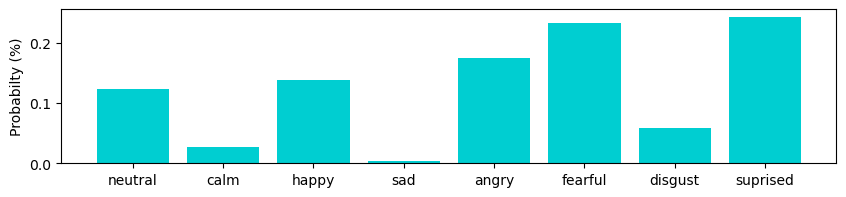

max emotion: suprised
----------------------------------------------------------------------------------------------------
** session ended


C:\Users\admin\AppData\Local\Temp\ipykernel_10060\3409454499.py:76: DeprecationWarning: NumPy will stop allowing conversion of out-of-bound Python integers to integer arrays.  The conversion of 189 to int8 will fail in the future.
For the old behavior, usually:
    np.array(value).astype(dtype)
will give the desired result (the cast overflows).
  last_frames = np.array(struct.unpack(str(96 * CHUNK) + 'B' , np.stack(( frames[-1], frames[-2], frames[-3], frames[-4],
C:\Users\admin\AppData\Local\Temp\ipykernel_10060\3409454499.py:76: DeprecationWarning: NumPy will stop allowing conversion of out-of-bound Python integers to integer arrays.  The conversion of 255 to int8 will fail in the future.
For the old behavior, usually:
    np.array(value).astype(dtype)
will give the desired result (the cast overflows).
  last_frames = np.array(struct.unpack(str(96 * CHUNK) + 'B' , np.stack(( frames[-1], frames[-2], frames[-3], frames[-4],
C:\Users\admin\AppData\Local\Temp\ipykernel_10060\3409454499.p

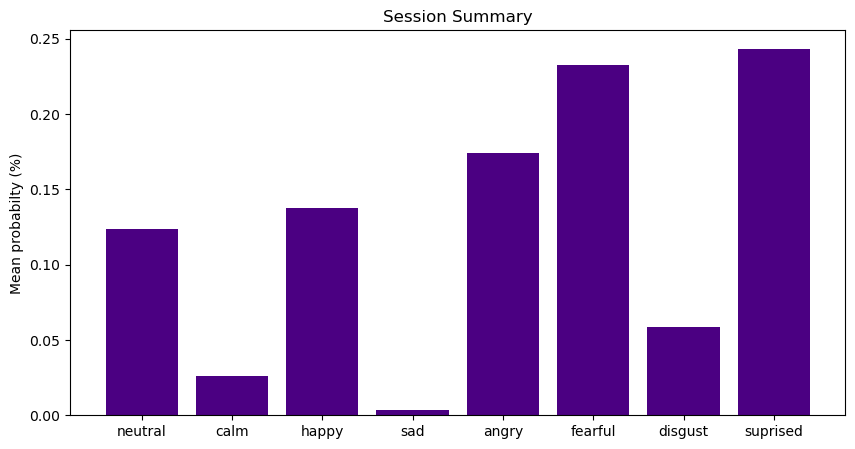

Emotions analyzed for: 7.4153 seconds


In [178]:
import pyaudio
import wave
from array import array
import struct
import time

# Initialize variables
RATE = 48000
CHUNK = 512
RECORD_SECONDS = 7.1

FORMAT = pyaudio.paInt32
CHANNELS = 1
WAVE_OUTPUT_FILE = "C:/Users/admin/Documents/3rd year second semester/CAPSTONE PROJECT/.wav"

# Open an input channel
p = pyaudio.PyAudio()
stream = p.open(format=FORMAT,
                channels=CHANNELS,
                rate=RATE,
                input=True,
                frames_per_buffer=CHUNK)


# Initialize a non-silent signals array to state "True" in the first 'while' iteration.
data = array('h', np.random.randint(size = 512, low = 0, high = 500))

# SESSION START
print("** session started      READ THE STATEMENT IF NECESSARY")
print("01: \"Kids are talking by the door\"\n02: \"Dogs are sitting by the door\"")

total_predictions = [] # A list for all predictions in the session.
tic = time.perf_counter()

while is_silent(data) == False:
    print("* recording...")
    frames = [] 
    data = np.nan # Reset 'data' variable.

    timesteps = int(RATE / CHUNK * RECORD_SECONDS) # => 339

    # Insert frames to 'output.wav'.
    for i in range(0, timesteps):
        data = array('l', stream.read(CHUNK)) 
        frames.append(data)

        wf = wave.open(WAVE_OUTPUT_FILE, 'wb')
        wf.setnchannels(CHANNELS)
        wf.setsampwidth(p.get_sample_size(FORMAT))
        wf.setframerate(RATE)
        wf.writeframes(b''.join(frames))

    print("* done recording")
    data, sample_rate = librosa.load(WAVE_OUTPUT_FILE, sr=48000, duration=2.5, offset=0.6)
    x = extract_features(data, sample_rate=48000)  # Extract features
    x_reshaped = x.reshape(1, 185, 1)  # Reshape for model input

# Make the prediction
    predictions = model.predict(x_reshaped)
    pred_list = list(predictions)
    pred_np = np.squeeze(np.array(pred_list).tolist(), axis=0) # Get rid of 'array' & 'dtype' statments.
    total_predictions.append(pred_np)
    
    # Present emotion distribution for a sequence (7.1 secs).
    fig = plt.figure(figsize = (10, 2))
    plt.bar(emo_list, pred_np, color = 'darkturquoise')
    plt.ylabel("Probabilty (%)")
    plt.show()
    
    max_emo = np.argmax(predictions)
    print('max emotion:', emotions.get(max_emo,-1))
    
    print(100*'-')
    
    # Define the last 2 seconds sequence.
    last_frames = np.array(struct.unpack(str(96 * CHUNK) + 'B' , np.stack(( frames[-1], frames[-2], frames[-3], frames[-4],
                                                                            frames[-5], frames[-6], frames[-7], frames[-8],
                                                                            frames[-9], frames[-10], frames[-11], frames[-12],
                                                                            frames[-13], frames[-14], frames[-15], frames[-16],
                                                                            frames[-17], frames[-18], frames[-19], frames[-20],
                                                                            frames[-21], frames[-22], frames[-23], frames[-24]),
                                                                            axis =0)) , dtype = 'b')
    if is_silent(last_frames): # If the last 2 seconds are silent, end the session.
        break

# SESSION END        
toc = time.perf_counter()
stream.stop_stream()
stream.close()
p.terminate()
wf.close()
print('** session ended')

# Present emotion distribution for the whole session.
total_predictions_np =  np.mean(np.array(total_predictions).tolist(), axis=0)
fig = plt.figure(figsize = (10, 5))
plt.bar(emo_list, total_predictions_np, color = 'indigo')
plt.ylabel("Mean probabilty (%)")
plt.title("Session Summary")
plt.show()

print(f"Emotions analyzed for: {(toc - tic):0.4f} seconds")

# SVM AND  ENSEMBLE LEANING ( SVN + RANDOM FOREST)

In [370]:

# Encode the emotion labels
label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(Y)

# List of unique emotions
emotions = label_encoder.classes_

ValueError: y should be a 1d array, got an array of shape (6144, 8) instead.

In [184]:

## One-vs-All Classification
for emotion in emotions:
  # Create binary labels for one-vs-all classification (1 for the current emotion, 0 for others)
  y_bin = np.where(y_encoded == label_encoder.transform([emotion])[0], 1, 0)

    #Split data
  X_train, X_test, y_train, y_test = train_test_split(X, y_bin, test_size=0.3, random_state=42)

    # Train binary classifier
  clf = SVC(kernel='linear', probability=True)
  clf.fit(X_train, y_train)

    # Predict and evaluate
  y_pred = clf.predict(X_test)
  print(f"Results for emotion: {emotion}")
  print(classification_report(y_test, y_pred))

ValueError: Found input variables with inconsistent numbers of samples: [6144, 92703]

In [99]:
# Filter for 5 emotions: Angry, Neutral, Calm, fearful, Surprised
emotions_to_keep = ['angry', 'neutral', 'calm', 'fearful', 'surprised']
filtered_data = filtered_final_df[filtered_final_df['Emotion'].isin(emotions_to_keep)]

# Map emotions to integers if not already
emotion_map = {emotion: idx for idx, emotion in enumerate(emotions_to_keep)}
filtered_data['Emotion'] = filtered_data['Emotion'].map(emotion_map)

# Split features and labels
X = filtered_data.drop(columns=['Emotion'])
y = filtered_data['Emotion']

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

C:\Users\admin\AppData\Local\Temp\ipykernel_10060\2438961482.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_data['Emotion'] = filtered_data['Emotion'].map(emotion_map)


In [101]:

# Scale features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)



c:\Users\admin\anaconda3\Lib\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\Users\admin\anaconda3\Lib\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_

Training Accuracy: 1.0000
Testing Accuracy: 0.8264


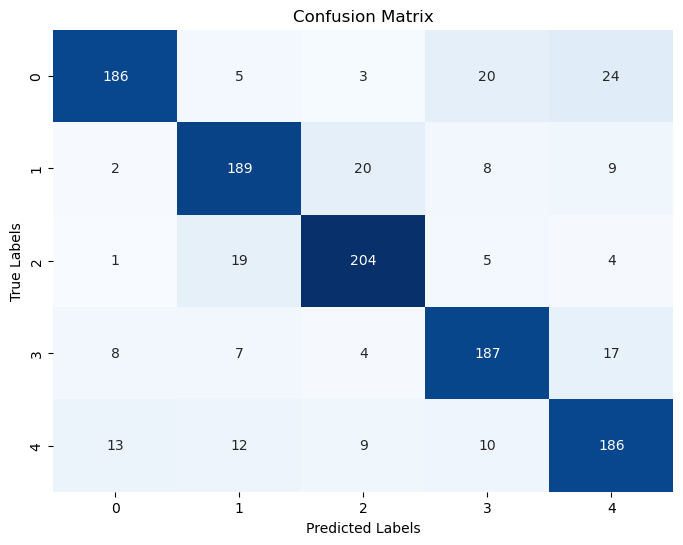

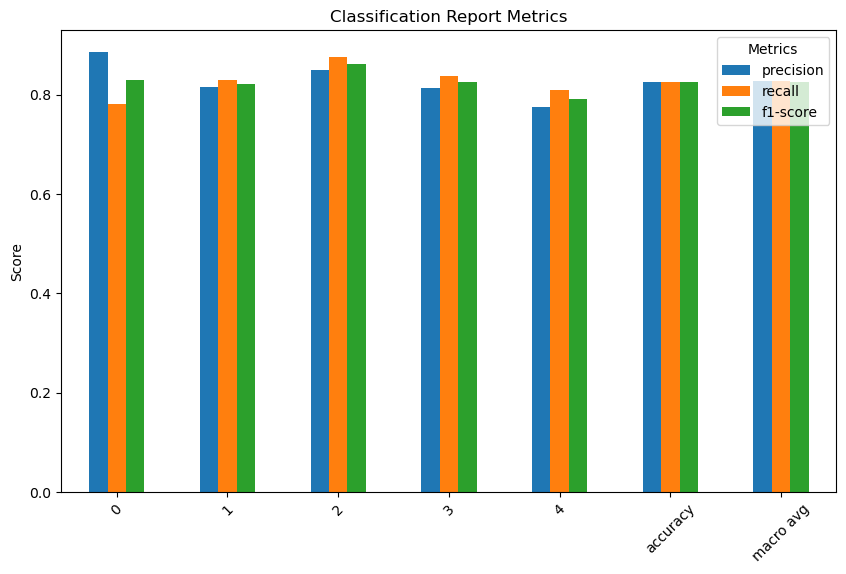

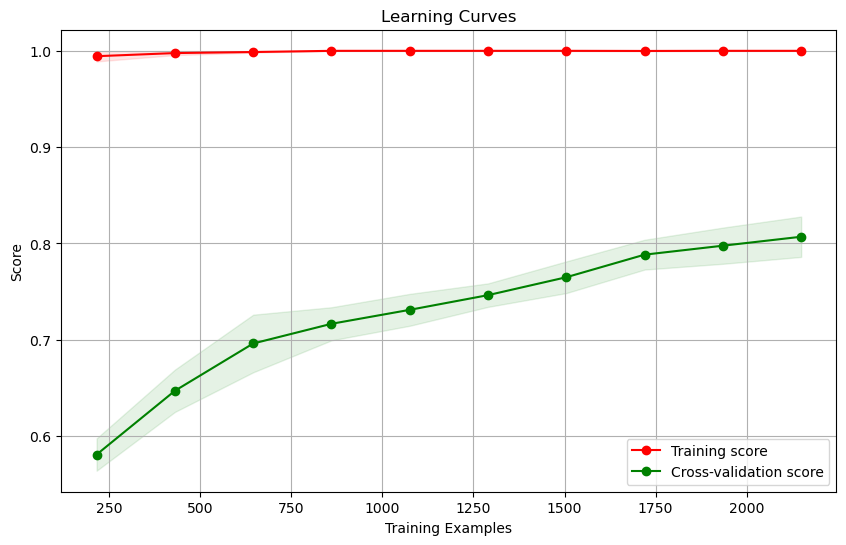

In [102]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.ensemble import StackingClassifier, RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report
from sklearn.model_selection import learning_curve

# Define base models
base_models = [
    ('svm', SVC(kernel='linear', probability=True)),
    ('rf', RandomForestClassifier()),
    ('logreg', LogisticRegression())
]

# Define meta-model
meta_model = LogisticRegression()

# Create the stacking ensemble
stacking_clf = StackingClassifier(estimators=base_models, final_estimator=meta_model)

# Train the stacking ensemble model
stacking_clf.fit(X_train_scaled, y_train)

# Predict on test data
y_test_pred = stacking_clf.predict(X_test_scaled)
y_train_pred = stacking_clf.predict(X_train_scaled)

# Calculate accuracy for training and testing sets
train_accuracy = accuracy_score(y_train, y_train_pred)
test_accuracy = accuracy_score(y_test, y_test_pred)

print(f"Training Accuracy: {train_accuracy:.4f}")
print(f"Testing Accuracy: {test_accuracy:.4f}")

# Confusion Matrix
conf_matrix = confusion_matrix(y_test, y_test_pred)

# Plotting the confusion matrix using seaborn
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.title('Confusion Matrix')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()

# Classification Report
report = classification_report(y_test, y_test_pred, output_dict=True)

# Bar plot for precision, recall, and F1-score
metrics_df = pd.DataFrame(report).transpose()
metrics_df.drop(['support'], axis=1, inplace=True)

plt.figure(figsize=(10, 6))
metrics_df.iloc[:-1].plot(kind='bar', ax=plt.gca())
plt.title('Classification Report Metrics')
plt.ylabel('Score')
plt.xticks(rotation=45)
plt.legend(title='Metrics')
plt.show()

# Plotting Learning Curves
train_sizes, train_scores, test_scores = learning_curve(
    stacking_clf, X_train_scaled, y_train, cv=5, n_jobs=-1,
    train_sizes=np.linspace(0.1, 1.0, 10)
)

# Calculate the mean and std for train and test scores
train_scores_mean = np.mean(train_scores, axis=1)
test_scores_mean = np.mean(test_scores, axis=1)
train_scores_std = np.std(train_scores, axis=1)
test_scores_std = np.std(test_scores, axis=1)

# Plotting Learning Curves
plt.figure(figsize=(10, 6))
plt.plot(train_sizes, train_scores_mean, 'o-', color='r', label='Training score')
plt.plot(train_sizes, test_scores_mean, 'o-', color='g', label='Cross-validation score')

# Plot the std deviation as shaded area
plt.fill_between(train_sizes, train_scores_mean - train_scores_std,
                 train_scores_mean + train_scores_std, color='r', alpha=0.1)
plt.fill_between(train_sizes, test_scores_mean - test_scores_std,
                 test_scores_mean + test_scores_std, color='g', alpha=0.1)

plt.title('Learning Curves')
plt.xlabel('Training Examples')
plt.ylabel('Score')
plt.legend(loc='best')
plt.grid()
plt.show()
